In [1]:
import jax
import numpy as onp
from jax import numpy as np
from jax import vmap, jit
from jax.tree_util import tree_map


from functools import partial
from typing import Callable


import matplotlib as mpl
from matplotlib import animation
from matplotlib import pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
import seaborn as sns
from ml_collections import config_dict
import ml_collections


from typing import Tuple, Dict, Callable, List, Optional

import functools
import dill as pickle


from tqdm.notebook import tqdm
import time


import sys
sys.path.append('../../py')
import common.systems as systems
import common.pflow_utils as pflow_utils
import launchers.learn as learn


%matplotlib inline
%load_ext autoreload
%autoreload 2

    
mpl.rcParams['axes.grid']  = True
mpl.rcParams['axes.grid.which']  = 'both'
mpl.rcParams['xtick.minor.visible']  = True
mpl.rcParams['ytick.minor.visible']  = True
mpl.rcParams['xtick.minor.visible']  = True
mpl.rcParams['axes.facecolor'] = 'white'
mpl.rcParams['grid.color'] = '0.8'
mpl.rcParams['text.usetex'] = True
mpl.rcParams['font.family'] = 'serif'
mpl.rcParams['figure.figsize'] = (8, 4)
mpl.rcParams['figure.titlesize'] = 17.5
mpl.rcParams['font.size'] = 17.5
mpl.rcParams['legend.fontsize'] = 15
mpl.rcParams['figure.dpi'] = 125
plt.rcParams['text.latex.preamble'] = r'\usepackage{amsmath}'

# Load data

In [2]:
## where to load the data
# base_folder = '/scratch/nb3397/results/strato/vicsek/7_15_24'
base_folder = '/scratch/nb3397/results/strato/vicsek/7_22_24'

## name of the files
# output_name = '7_15_24_N64_1_50'
# output_name = '7_15_24_N64_3_50'
# output_name = '7_15_24_N64_5_29'
# output_name = '7_15_24_N64_5'
output_name = '7_22_24_N64_production_0_43'

## actually load the data
data = pickle.load(open(f'{base_folder}/{output_name}.npy', 'rb'))

## where to save figures / movies
figure_output = f'{base_folder}/figures/9_8_24'

## where to save / load data
data_output = f'{base_folder}/figures/data/9_5_24'

In [3]:
# for backwards compatibility with 7_11_24 runs
cfg = data['cfg']
if output_name == '7_11_24_N64_0_12':
    unfrozen_cfg = config_dict.ConfigDict(cfg)
    unfrozen_cfg.use_layernorm = False
    unfrozen_cfg.sum_pool = False
    unfrozen_cfg.use_residual = False
    cfg = config_dict.FrozenConfigDict(unfrozen_cfg)  # freeze the config

In [4]:
params = data['params']
ema_params = data['ema_params']
xgs = data['xgs']
xs, gs = np.split(xgs, 2, axis=1)
net, map_net = learn.construct_network(cfg)

# a bit unsafe
learn.cfg = cfg
learn.net = net
learn.map_net = map_net

# Simulate trajectory data

In [5]:
def generate_trajectory(
    nbatches: int,
    thermalize_fac: float,
    tf_fac: float,
    N: int,
    phi: float,
    cfg: ml_collections.ConfigDict
) -> np.ndarray:
    ## construct system
    if cfg.d == 2:
        r = onp.sqrt(4 * phi * cfg.width**2 / (N * onp.pi))
    else:
        r = cfg.width * phi / N

    system = systems.Vicsek(
        cfg.dt, r, cfg.v0, cfg.gamma, cfg.width, 
        cfg.eps, cfg.d, N, cfg.beta, cfg.k, cfg.A, 
        cfg.gstar_mag, cfg.rescale_type
    )


    ## thermalization parameters
    tf                = thermalize_fac / (1.0 if cfg.rescale_type == 'time' else cfg.gamma)
    nsteps_thermalize = int((tf / cfg.dt) // nbatches) + 1


    ## trajectory parameters
    tf_data = tf_fac / cfg.gamma
    nsteps_data = int(tf_data / cfg.dt) + 1
    nbatches_data = nbatches
    nsteps_data_batch = nsteps_data // nbatches_data
    key = jax.random.PRNGKey(onp.random.randint(10000))


    ## set up the trajectory storage
    sig0x = cfg.width / 2
    sig0g = 1.0 / (np.sqrt(cfg.gamma) if cfg.rescale_type == 'g' else 1.0)
    init_xs = systems.torus_project(sig0x*onp.random.randn(N, cfg.d), cfg.width)
    init_gs = sig0g*onp.random.randn(N, cfg.d)
    init_xgs = onp.concatenate((init_xs, init_gs))


    ## thermalize
    for curr_batch in tqdm(range(nbatches)):
        batch_start = time.time()
        noises = jax.random.normal(key, shape=(nsteps_thermalize, 2*N, cfg.d))
        key = jax.random.split(key)[0]
        init_xgs, _ = systems.rollout(init_xgs, noises, system.step)
        batch_end = time.time()


    ## trajectory
    traj = onp.zeros((nsteps_data+1, *init_xgs.shape))
    traj[0] = init_xgs
    start_time = time.time()
    for curr_batch in range(nbatches_data):
        lb = 1 + nsteps_data_batch*curr_batch
        ub = lb + nsteps_data_batch
        noises = jax.random.normal(key, shape=(nsteps_data_batch, 2*N, cfg.d))
        key = jax.random.split(key)[0]
        init_xgs, traj[lb:ub] = systems.rollout(init_xgs, noises, system.step)


    if ub < traj.shape[0]:
        print(f'Filling in the boundary case: {(ub, traj.shape[0])}')
        noises = jax.random.normal(key, shape=(traj.shape[0]-ub, 2*N, cfg.d))
        key = jax.random.split(key)[0]
        init_xgs, traj[ub:] = systems.rollout(init_xgs, noises, system.step)


    print('Finished generating trajectory.')
    return traj

# Calculate learned quantities

In [110]:
@functools.partial(jax.jit, static_argnums=3)
@functools.partial(jax.vmap, in_axes=(None, 0, 0, None))
def compute_div_v(
    params: Dict,
    xs: np.ndarray,
    gs: np.ndarray,
    net: Callable
) -> np.ndarray:
    return net.apply(params['g'], xs, gs, "g", method="particle_div")


@jax.jit
@functools.partial(jax.vmap, in_axes=(None, 0, 0))
def compute_xdot(
    params: Dict,
    xs: np.ndarray,
    gs: np.ndarray,
) -> np.ndarray:
    if cfg.rescale_type == 'g':
        return cfg.v0 * np.sqrt(cfg.gamma) * gs
    else:
        return cfg.v0 * gs

@functools.partial(jax.jit, static_argnums=3)
@functools.partial(jax.vmap, in_axes=(None, 0, 0, None))
def compute_gdot(
    params: Dict,
    xs: np.ndarray,
    gs: np.ndarray,
    net: Callable
) -> np.ndarray:
    return net.apply(params['g'], xs, gs)


def calc_learned_quantities(
    params: Dict,
    traj: np.ndarray,
    nbatches_compute: int,
    net: Callable
) -> Tuple[np.ndarray, np.ndarray, np.ndarray]:
    traj_xs, traj_gs = np.split(traj, 2, axis=1)
    div_vs = onp.zeros((traj.shape[0], traj_xs.shape[1]))
    xdots  = onp.zeros((traj.shape[0], traj_xs.shape[1], traj_xs.shape[2]))
    gdots  = onp.zeros((traj.shape[0], traj_xs.shape[1], traj_xs.shape[2]))

    bs = traj.shape[0] // nbatches_compute
    print(f'bs: {bs}, total samples: {traj.shape[0]}')
    
    for kk in tqdm(range(nbatches_compute)):
        lb = bs*kk
        ub = lb + bs
    
        div_vs[lb:ub] = compute_div_v(params, traj_xs[lb:ub], traj_gs[lb:ub], net)
        xdots[lb:ub]  = compute_xdot(params, traj_xs[lb:ub], traj_gs[lb:ub])
        gdots[lb:ub]  = compute_gdot(params, traj_xs[lb:ub], traj_gs[lb:ub], net)
    
    
    if ub < traj.shape[0]:
        print(f'Capping off the uneven batch at the end. ({ub}, {traj.shape[0]})')
        div_vs[ub:] = compute_div_v(params, traj_xs[ub:], traj_gs[ub:], net)
        xdots[ub:]  = compute_xdot(params, traj_xs[ub:], traj_gs[ub:])
        gdots[ub:]  = compute_gdot(params, traj_xs[ub:], traj_gs[ub:], net)

    return div_vs, xdots, gdots

# Make trajectory order statistics plots

In [7]:
def plot_order_stats_traj(
    gs: np.ndarray, # [nt, N, d]
    vgs: np.ndarray, # [nt, N, d]
    traj_skip: int,
    cfg: dict,
    save_str: str = ''
) -> None:
    nt, N, d = gs.shape
    time = np.arange(nt) * traj_skip * cfg.dt * cfg.gamma

    # Calculate means over particles
    mean_gs = np.mean(gs, axis=1)  # [nt, d]
    mean_vgs = np.mean(vgs, axis=1)  # [nt, d]

    # Set up the plot
    plt.close('all')
    fw, fh = 4, 4
    fontsize = 22
    nrows = 3
    ncols = 2
    titles = [r"$\bar{g}_x$", r"$\bar{g}_y$", r"$\dot{\bar{g}}_{x}$", r"$\dot{\bar{g}}_{y}$", r"$|\bar{g}|$", r"$|\dot{\bar{g}}|$"]
    quantities = [mean_gs[:, 0], mean_gs[:, 1], mean_vgs[:, 0], mean_vgs[:, 1], np.linalg.norm(mean_gs, axis=-1), np.linalg.norm(mean_vgs, axis=-1)]

    with sns.axes_style('whitegrid'), plt.rc_context({'text.usetex': True, 'font.family': 'serif'}):
        fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols*fw, nrows*fh), constrained_layout=True, sharex=True, sharey=False,)
        axs = axs.flatten()

        for kk, ax in enumerate(axs):
            # Plot time series
            ax.plot(time, quantities[kk], color='C0')
            ax.set_title(titles[kk], fontsize=fontsize)
            # ax.set_ylabel(titles[kk], fontsize=fontsize)
            # ax.tick_params(axis='both', direction='in', which='both')
            ax.tick_params(axis='both', labelsize=0.8*fontsize)
            ax.grid(True, color='0.75', alpha=0.5)

            # set labels
            if kk >= (nrows*ncols - 3):
                ax.set_xlabel(r'$t\gamma$', fontsize=fontsize)

        # Save or show the plot
        if save_str:
            fig.patch.set_facecolor('none')
            fig.savefig(save_str, dpi=300, bbox_inches='tight', facecolor='none')
        else:
            plt.show()

In [52]:
order_stats_traj = generate_trajectory(
    nbatches=100,
    thermalize_fac=10.0,
    tf_fac=2.5,
    N=cfg.N,
    phi=cfg.phi,
    cfg=cfg
)

  0%|          | 0/100 [00:00<?, ?it/s]

Filling in the boundary case: (50001, 50002)
Finished generating trajectory.


In [53]:
order_stats_skip=10

order_stats_div_vs, order_stats_xdots, order_stats_gdots = calc_learned_quantities(
    params=ema_params[0.9999],
    traj=order_stats_traj[::order_stats_skip],
    nbatches_compute=100,
    net=net
)

bs: 50, total samples: 5001


  0%|          | 0/100 [00:00<?, ?it/s]

Capping off the uneven batch at the end. (5000, 5001)


In [54]:
order_stats_xs, order_stats_gs = np.split(order_stats_traj, 2, axis=1)

In [55]:
order_stats_gdots.shape

(5001, 64, 2)

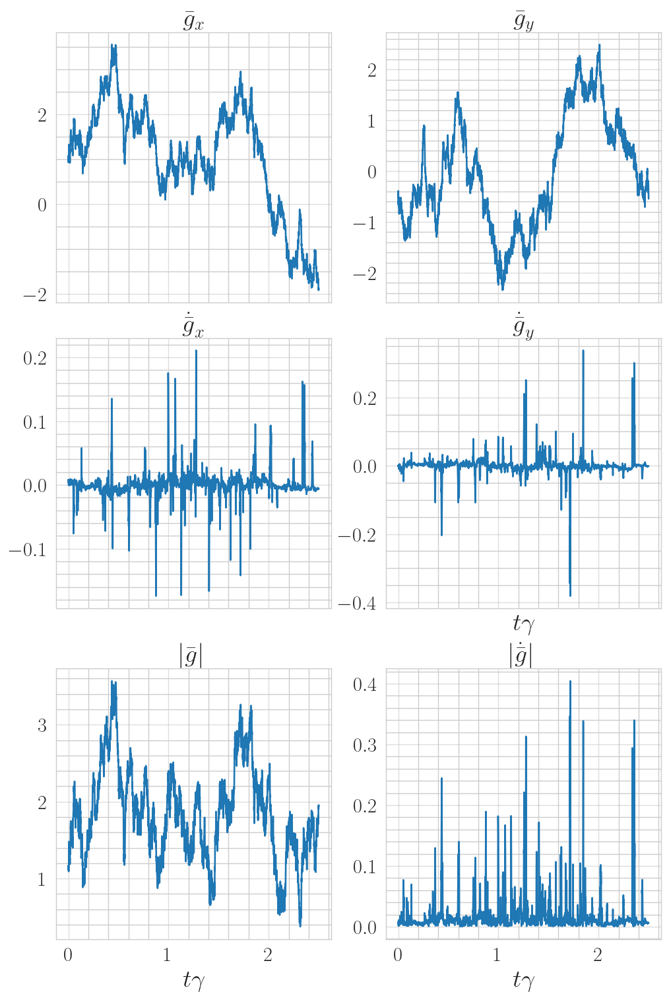

In [65]:
plot_order_stats_traj(
    gs=order_stats_gs[::order_stats_skip],
    vgs=order_stats_gdots,
    traj_skip=order_stats_skip,
    cfg=cfg,
    save_str=''
)

# Make overview still frame

In [9]:
def make_overview_still_frame(
    fw: float,
    fh: float,
    xs: np.ndarray,
    gs: np.ndarray,
    cfg: ml_collections.FrozenConfigDict,
    flock_ids: np.ndarray,
    plot_gspace: bool,
    output_folder: str,
    output_name: str
) -> None:
    # process flocks and create colormap
    unique_flocks = onp.unique(flock_ids)
    n_flocks = len(unique_flocks)
    print(f'Number of flocks: {n_flocks}')
    cmap = sns.cubehelix_palette(n_colors=n_flocks, dark=0.35)
    color_dict = {flock: cmap[i] for i, flock in enumerate(unique_flocks)}
    # color_dict = {flock: f'C{flock}' for i, flock in enumerate(unique_flocks)}
    colors = [color_dict[flock] for flock in flock_ids]
    
    # recenter to center of mass frame
    xs = xs - np.mean(xs, axis=0)[None, :]

    # Normalize gs
    normalized_gs = gs / np.linalg.norm(gs, axis=1, keepdims=True)

    # make axes
    if plot_gspace:
        ncols = 2
    else:
        ncols = 1

    fig, axs = plt.subplots(nrows=1, ncols=ncols, figsize=(fw, fh), constrained_layout=True, sharex=False, sharey=False)
    if not plot_gspace:
        axs = [axs]
    
    # Set plot limits and properties
    for kk, ax in enumerate(axs):
        if kk == 0:
            ax.set_xlim([-cfg.width, cfg.width])
            ax.set_ylim([-cfg.width, cfg.width])
            ax.set_aspect(1.0)
    
        ax.grid(which='both', axis='both', color='0.90', alpha=0.0)
        ax.set_facecolor('k')
        ax.set_xticks([])
        ax.set_yticks([])

        for spine in ax.spines.values():
            spine.set_edgecolor(None)
    
    ## x frame
    axs[0].set_ylabel(r"$y$", fontsize=16)
    axs[0].set_xlabel(r"$x$", fontsize=16)
    # axs[0].set_title('position', fontsize=16)
    
    # Plot particles
    quiver = axs[0].quiver(
        xs[:, 0], xs[:, 1], normalized_gs[:, 0], normalized_gs[:, 1],
        angles='xy', scale_units='xy', scale=10.0, color=colors,
        alpha=0.9
    )
    
    # Plot interaction radii
    scale = axs[0].transData.get_matrix()[0, 0]
    scatter = axs[0].scatter(
        xs[:, 0], xs[:, 1],
        s=np.pi * cfg.r**2 * scale**2,  # size in points^2
        facecolors='none',
        edgecolors='white',
        alpha=0.25,
        zorder=0
    )

    if plot_gspace:
        ## x frame
        axs[1].set_ylabel(r"$g_y$", fontsize=16)
        axs[1].set_xlabel(r"$g_x$", fontsize=16)
        # axs[1].set_title('velocity', fontsize=16)

        axs[1].set_xlim([-12.5, 12.5])
        axs[1].set_ylim([-12.5, 12.5])
        axs[1].set_aspect(1.0)
        
        # Plot interaction radii
        scale = axs[1].transData.get_matrix()[0, 0]
        scatter = axs[1].scatter(
            gs[:, 0], gs[:, 1],
            s=10,
            # s=np.pi * cfg.r**2 * scale**2,  # size in points^2
            # color='white',
            color=colors,
            # facecolors='none',
            # edgecolors='white',
            alpha=0.9,
        )
    
    # Save the figure
    if output_name != '':
        plt.savefig(f'{output_folder}/{output_name}.pdf', dpi=300)
        print(f'Saved to {output_folder}/{output_name}.pdf')

    plt.show()
    plt.close(fig)

In [10]:
from sklearn.cluster import DBSCAN

def find_flock_ids(
    xs: np.ndarray, 
    gs: np.ndarray, 
    eps: float = 0.5, 
    min_samples: int = 5
) -> np.ndarray:
    # combine normalized position and velocity information
    xs = (xs - np.mean(xs, axis=0)) / np.std(xs, axis=0)
    gs = (gs - np.mean(gs, axis=0)) / np.std(gs, axis=0)
    features = onp.hstack([xs, gs])
    
    # apply DBSCAN clustering
    clustering = DBSCAN(eps=eps, min_samples=min_samples).fit(features)
    
    # Return cluster labels (flock IDs)
    return clustering.labels_

[ 0  0  1  0  2  0  0  0  3  4  1  0  1  4  0  1  5  1  2  0  0  0  2  0
  0  1  6  4  0  0  0  1  7  0  1  1  4  4  0  0  0  0  0  0  0  0  0  4
  0  0  0  1  0  8  0  9  0  5  0  0  5  0 10  0]
Number of flocks: 11
Saved to /scratch/nb3397/results/strato/vicsek/7_22_24/figures/overview_frame.pdf


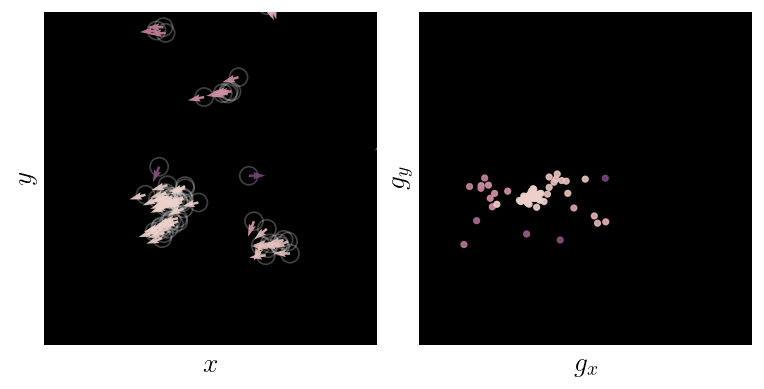

In [101]:
fig_dim = 3
plot_index = 0

flock_ids = find_flock_ids(xs[plot_index], gs[plot_index], eps=1.0, min_samples=1)
print(flock_ids)

make_overview_still_frame(
    fw=2*fig_dim,
    fh=fig_dim,
    xs=xs[plot_index],
    gs=gs[plot_index],
    cfg=cfg,
    flock_ids=flock_ids,
    plot_gspace=True,
    output_folder=figure_output,
    output_name='overview_frame'
    # output_name=''
)

# Make entropy movie

In [7]:
def make_entropy_movie(
    params: Dict,
    traj: np.ndarray,
    div_vs: np.ndarray,
    xdots: np.ndarray,
    gdots: np.ndarray,
    nframes: int,
    clip_quantile: float,
    skip: int,
    output_folder: str,
    output_name: str,
    cfg: ml_collections.FrozenConfigDict,
    plot_gdots: bool
) -> None:
    plt.close('all')


    ## set up basic figure properties
    fw, fh    = 4, 5
    fraction  = 0.2
    pad       = 0.025
    shrink    = 0.5
    fontsize  = 16.0
    lw        = 0.5
    nrows     = 1
    ncols     = 5

    fig = plt.figure(figsize=(fw*ncols, fh*nrows), constrained_layout=True)
    gs = fig.add_gridspec(nrows, ncols)
    axs = [fig.add_subplot(gs[0, i]) for i in range(ncols-1)]
    line_ax = fig.add_subplot(gs[:, -1])  # New axis for line pl


    ## define variables to be visualized
    xdot_norms = np.linalg.norm(xdots, axis=-1)
    gdot_norms = np.linalg.norm(gdots, axis=-1)
    quantities = [None,              div_vs,     xdot_norms,     gdot_norms]
    titles     = [None, r"$\nabla \cdot v$", r"$|\dot{x}|$", r"$|\dot{g}|$"]
    cmaps      = [
        None, 
        custom_div, 
        sns.color_palette("mako", as_cmap=True), 
        sns.color_palette("mako", as_cmap=True)
    ]


    ## set up particle panels
    for kk, ax in enumerate(axs):
        ax.set_xlim([-cfg.width, cfg.width])
        ax.set_ylim([-cfg.width, cfg.width])
        ax.grid(which='both', axis='both', color='0.90', alpha=0.0)
        ax.axes.set_aspect(1.0)
        ax.set_facecolor('k')
        ax.set_xticks([])
        ax.set_yticks([])

        if kk == 0:
            ax.set_ylabel(r"$y$", fontsize=fontsize)
        ax.set_xlabel(r"$x$", fontsize=fontsize)

        for spine in ax.spines.values():
            spine.set_edgecolor(None)
    scale = axs[0].transData.get_matrix()[0, 0]


    ## set up line plot
    N = div_vs.shape[1]
    total_div_vs = np.sum(div_vs, axis=1) / N
    min_div_v, max_div_v = np.min(total_div_vs), np.max(total_div_vs)
    total_max = max(np.abs(min_div_v), np.abs(max_div_v))
    line_data = []
    line, = line_ax.plot([], [], lw=2)
    line_ax.set_xlabel(r'$t\gamma$')
    line_ax.set_ylabel(r"$\nabla\cdot v / N$")
    line_ax.set_ylim([min_div_v - 0.1*total_max, max_div_v + 0.1*total_max])
    tmax = traj.shape[0] * cfg.dt * skip * cfg.gamma
    line_ax.set_xlim([0, tmax])


    ## set up initial data
    quivers = []
    # circles = [[] for _ in range(4)]
    scatters = []
    norms = []
    init_xs, init_gs = np.split(traj[0], 2)
    init_gs = jax.vmap(lambda g: g / np.linalg.norm(g))(init_gs)


    for kk, ax in enumerate(axs):
        quantity = quantities[kk]

        ## set colorbar limits
        if quantity is not None:
            frame_quantity = quantity[0]
            vmin = np.quantile(quantity, clip_quantile)
            vmax = np.quantile(quantity, 1-clip_quantile)

            # symmetrize for div_v
            if kk == 1:
                vmin = min(vmin, -vmax)
                vmax = max(vmax, -vmin)

            # set minimum to zero for norms
            else:
                vmin = 0.0
        else:
            vmin, vmax = 0.0, 1.0


        ## set up colorbars and normalizers
        norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax, clip=True)
        norms.append(norm)
        mappable = mpl.cm.ScalarMappable(cmap=cmaps[kk], norm=norm)
        mappable.set_array([])
        cbar = fig.colorbar(mappable=mappable, norm=norm, ax=ax, 
                            fraction=fraction, shrink=shrink, pad=pad, 
                            orientation='horizontal')
        cbar.set_label(titles[kk], fontsize=fontsize)
        cbar.ax.tick_params(which='both', labelsize=0.8*fontsize, width=0, length=0)
        cbar.outline.set_edgecolor('grey')


        ## plot birds
        if kk == 0:
            quiver = ax.quiver(
                init_xs[:, 0], init_xs[:, 1], init_gs[:, 0], init_gs[:, 1], 
                angles='xy', scale_units='xy', scale=10.0, color='white'
            )
            cbar.ax.set_visible(False)
        else:
            quiver = ax.quiver(
                init_xs[:, 0], init_xs[:, 1], init_gs[:, 0], init_gs[:, 1], 
                angles='xy', scale_units='xy', scale=10.0, 
                color=cmaps[kk](norm(frame_quantity))
            )
        quivers.append(quiver)


        ## plot interaction radii
        scatter = ax.scatter(
            init_xs[:, 0], init_xs[:, 1],
            s=cfg.r**2 * scale**2,  # size in points^2
            facecolors='none',
            edgecolors='white',
            alpha=0.25,
            zorder=0
        )
        scatters.append(scatter)
        
    plt.suptitle(fr"$t=0$")


    def init():
        line.set_data([], [])
        return quivers + scatters + [line]


    def animate(frame: int):
        nonlocal quivers, scatters, line_data, line

        ## set up static-like count variable
        if not hasattr(animate, "count"):
            animate.count = 0

        ## update quiver plots and circles
        t = frame * skip * cfg.dt * cfg.gamma
        xs, gs = np.split(traj[frame], 2)
        gs = jax.vmap(lambda g: g / np.linalg.norm(g))(gs)

        for kk, (ax, quiver, scatter) in enumerate(zip(axs, quivers, scatters)):
            quiver.set_offsets(xs)
            quiver.set_UVC(gs[:, 0], gs[:, 1])
            if kk > 0:
                frame_quantity = quantities[kk][frame]
                norm = norms[kk]
                cmap = cmaps[kk]
                quiver.set_color(cmap(norm(frame_quantity)))

            # update circle positions
            scatter.set_offsets(xs)

        ## update the line plot
        line_data.append((t, total_div_vs[frame]))
        line.set_data(*zip(*line_data))

        ## set total time on whole movie
        plt.suptitle(fr"$t=${t:0.3f}$\gamma$")

        ## print some timing / diagnostic information
        if animate.count % (nframes // 10) == 0:
            print(f'Finished animation on frame {animate.count}/{nframes}. Time: {time.time() - start_time}s.')

        ## return what changed in the plot
        animate.count += 1
        return [line]


    start_time = time.time()
    anim = animation.FuncAnimation(
        fig, animate, init_func=init, frames=np.linspace(0, traj.shape[0]-1, nframes, dtype=np.int32), 
        interval=0.1, blit=True, repeat=False, cache_frame_data=False
    )


    anim.save(f'{output_folder}/{output_name}.mp4', fps=30)
    print(f'Saved to {output_folder}/{output_name}.mp4')

In [8]:
## power law y axis without weird negative square root issue
def power_transform(x: np.ndarray, power: float):
    return np.where(x > 0, np.power(x, power), 0)

def make_entropy_movie_time_series(
    traj: np.ndarray,
    div_vs: np.ndarray,
    gdots: np.ndarray,
    nframes: int,
    clip_quantile: float,
    skip: int,
    output_folder: str,
    output_name: str,
    cfg: ml_collections.FrozenConfigDict,
    plot_gdots: bool
) -> None:
    plt.close('all')

    ## define variables to be visualized
    gdot_norms = np.sum(gdots**2, axis=-1)
    quantities = [None,                    div_vs,                gdot_norms]
    titles     = [None, r"$\dot{s}_{\text{sys}}$", r"$\dot{s}_{\text{tot}}$"]
    cmaps      = [
        None, 
        sns.color_palette("icefire", as_cmap=True),
        sns.color_palette("mako", as_cmap=True)
    ]

    ## set up basic figure properties
    fw, fh    = 5, 5
    fraction  = 0.2
    pad       = 0.025
    shrink    = 0.5
    fontsize  = 16.0
    lw        = 0.5
    nrows     = 2
    ncols     = len(titles)

    ## movies up top and time series down below
    fig = plt.figure(figsize=(fw*ncols, fh*nrows), constrained_layout=True)
    gs = fig.add_gridspec(nrows, ncols)
    axs_top = [fig.add_subplot(gs[0, i]) for i in range(ncols)]
    axs_bottom = [fig.add_subplot(gs[1, i+1]) for i in range(ncols-1)]


    ## set up particle panels
    for kk, ax in enumerate(axs_top):
        ax.set_xlim([-cfg.width, cfg.width])
        ax.set_ylim([-cfg.width, cfg.width])
        ax.grid(which='both', axis='both', color='0.90', alpha=0.0)
        ax.axes.set_aspect(1.0)
        ax.set_facecolor('k')
        ax.set_xticks([])
        ax.set_yticks([])

        if kk == 0:
            ax.set_ylabel(r"$y$", fontsize=fontsize)
        ax.set_xlabel(r"$x$", fontsize=fontsize)

        for spine in ax.spines.values():
            spine.set_edgecolor(None)
    scale = axs_top[0].transData.get_matrix()[0, 0]


    ## set up time series plots
    N = div_vs.shape[1]
    total_div_vs = np.sum(div_vs, axis=1) / N
    total_gdot_norms = np.sum(gdot_norms, axis=1) / N
    tmax = traj.shape[0] * cfg.dt * skip * cfg.gamma
    time_array = np.linspace(0, tmax, traj.shape[0])
    time_series_quantities = [          total_div_vs,                     total_gdot_norms]
    time_series_titles     = [r"$\dot{s}_{\text{sys}} / N$", r"$\dot{s}_{\text{tot}} / N$"]
    for kk, (ax, data, title) in enumerate(
        zip(axs_bottom, time_series_quantities, time_series_titles)
    ):
        line, = ax.plot([], [], lw=1)
        ax.set_xlabel(r'$t\gamma$')
        ax.set_ylabel(title)
        ax.set_xlim([0, tmax])
        if kk == len(axs_bottom) - 1:  # Last plot (total EPR)
            ax.set_yscale(
                mpl.scale.FuncScale(
                    axis=ax.yaxis, 
                    functions=(
                        lambda x: power_transform(x, 0.5), lambda x: power_transform(x, 2.0)
                    )
                )
            )
            ymin, ymax = np.min(data), np.max(data)*1.10
            margin = 0.1 * (np.sqrt(ymax) - np.sqrt(ymin))
            ax.set_ylim([ymin, ymax])
        else:
            ymin, ymax = np.min(data), np.max(data)
            margin = 0.1 * (ymax - ymin)
            ax.set_ylim([ymin - margin, ymax + margin])
        ax.tick_params(which='both', direction='in')
        
        for spine in ax.spines.values():
            spine.set_edgecolor('#CCCCCC')

    ## set up initial data
    quivers = []
    if plot_gdots:
        gdot_quivers = []
    scatters = []
    norms = []
    init_xs, init_gs = np.split(traj[0], 2)
    init_gs = jax.vmap(lambda g: g / np.linalg.norm(g))(init_gs)

    for kk, ax in enumerate(axs_top):
        quantity = quantities[kk]

        ## set colorbar limits
        if quantity is not None:
            frame_quantity = quantity[0]
            vmin = np.quantile(quantity, clip_quantile)
            vmax = np.quantile(quantity, 1-clip_quantile)

            # symmetrize for div_v
            if kk == 1:
                vmin = min(vmin, -vmax)
                vmax = max(vmax, -vmin)

            # set minimum to zero for norms
            else:
                vmin = 0.0
        else:
            vmin, vmax = 0.0, 1.0


        ## set up colorbars and normalizers
        norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax, clip=True)
        norms.append(norm)
        mappable = mpl.cm.ScalarMappable(cmap=cmaps[kk], norm=norm)
        mappable.set_array([])
        cbar = fig.colorbar(mappable=mappable, norm=norm, ax=ax, 
                            fraction=fraction, shrink=shrink, pad=pad, 
                            orientation='horizontal')
        cbar.set_label(titles[kk], fontsize=fontsize)
        cbar.ax.tick_params(which='both', labelsize=0.8*fontsize, width=0, length=0)
        cbar.outline.set_edgecolor('#CCCCCC')


        ## plot birds
        if kk == 0:
            quiver = ax.quiver(
                init_xs[:, 0], init_xs[:, 1], init_gs[:, 0], init_gs[:, 1], 
                angles='xy', scale_units='xy', scale=5.0, color='white',
                width=0.0125, headwidth=3, headlength=4, pivot='mid'
            )
            cbar.ax.set_visible(False)

            if plot_gdots:
                curr_gdots = jax.vmap(lambda gdot: gdot / np.linalg.norm(gdot))(gdots[0])
                gdot_quiver = ax.quiver(
                    init_xs[:, 0], init_xs[:, 1], curr_gdots[:, 0], curr_gdots[:, 1],
                    angles='xy', scale_units='xy', scale=10.0, color='C0'
                )
                gdot_quivers.append(gdot_quiver)
        else:
            quiver = ax.quiver(
                init_xs[:, 0], init_xs[:, 1], init_gs[:, 0], init_gs[:, 1], 
                angles='xy', scale_units='xy', scale=5.0, pivot='mid',
                color=cmaps[kk](norm(frame_quantity)),
                width=0.0125, headwidth=3, headlength=4
            )

        quivers.append(quiver)

        ## plot interaction radii
        scatter = ax.scatter(
            init_xs[:, 0], init_xs[:, 1],
            s=np.pi * cfg.r**2 * scale**2,  # size in points^2
            facecolors='none',
            edgecolors='white',
            alpha=0.25,
            zorder=0
        )
        scatters.append(scatter)

    plt.suptitle(fr"$t=0$")

    def init():
        if plot_gdots:
            return quivers + gdot_quivers + scatters + [line for ax in axs_bottom for line in ax.get_lines()]
        else:
            return quivers + scatters + [line for ax in axs_bottom for line in ax.get_lines()]


    def animate(frame: int):
        ## enable access of outer variables
        if plot_gdots:
            nonlocal quivers, gdot_quivers, scatters
        else:
            nonlocal quivers, scatters


        ## set up static-like count variable
        if not hasattr(animate, "count"):
            animate.count = 0


        ## update quiver plots and circles
        t = frame * skip * cfg.dt * cfg.gamma
        xs, gs = np.split(traj[frame], 2)
        gs = jax.vmap(lambda g: g / np.linalg.norm(g))(gs)

        for kk, (ax, quiver, scatter) in enumerate(zip(axs_top, quivers, scatters)):
            quiver.set_offsets(xs)
            quiver.set_UVC(gs[:, 0], gs[:, 1])

            if plot_gdots and kk == 0:
                curr_gdots = jax.vmap(lambda gdot: gdot / np.linalg.norm(gdot))(gdots[frame])
                gdot_quivers[kk].set_offsets(xs)
                gdot_quivers[kk].set_UVC(curr_gdots[:, 0], curr_gdots[:, 1])

            if kk > 0:
                frame_quantity = quantities[kk][frame]
                norm = norms[kk]
                cmap = cmaps[kk]
                quiver.set_color(cmap(norm(frame_quantity)))

            # update circle positions
            scatter.set_offsets(xs)


        ## update the time series plots
        for kk, (ax, data) in enumerate(
            zip(axs_bottom, time_series_quantities)
        ):
            line = ax.get_lines()[0]
            line.set_data(time_array[:frame+1], data[:frame+1])

        ## set total time on whole movie
        plt.suptitle(fr"$t=${t:0.3f}$\gamma$")


        ## print some timing / diagnostic information
        if animate.count % (nframes // 10) == 0:
            print(f'Finished animation on frame {animate.count}/{nframes}. Time: {time.time() - start_time}s.')


        ## return what changed in the plot
        animate.count += 1


        if plot_gdots:
            return quivers + scatters + [line for ax in axs_bottom for line in ax.get_lines()] + gdot_quivers
        else:
            return quivers + scatters + [line for ax in axs_bottom for line in ax.get_lines()]


    start_time = time.time()
    anim = animation.FuncAnimation(
        fig, animate, init_func=init, frames=np.linspace(0, traj.shape[0]-1, nframes, dtype=np.int32), 
        interval=0.1, blit=True, repeat=False, cache_frame_data=False
    )

    anim.save(f'{output_folder}/{output_name}.mp4', fps=30)
    print(f'Saved to {output_folder}/{output_name}.mp4')

In [9]:
def make_entropy_movie_time_series_g_space(
    traj: np.ndarray,
    div_vs: np.ndarray,
    xdots: np.ndarray,
    gdots: np.ndarray,
    nframes: int,
    clip_quantile: float,
    skip: int,
    output_folder: str,
    output_name: str,
    cfg: ml_collections.FrozenConfigDict,
) -> None:
    plt.close('all')

    # Set up basic figure properties
    fw, fh = 5, 5
    fraction = 0.2
    pad = 0.025
    shrink = 0.5
    fontsize = 16.0
    nrows = 2
    ncols = 4

    # Movies up top and time series down below
    fig = plt.figure(figsize=(fw*ncols, fh*nrows), constrained_layout=True)
    gs = fig.add_gridspec(nrows, ncols)
    axs_top = [fig.add_subplot(gs[0, i]) for i in range(ncols)]
    axs_bottom = [fig.add_subplot(gs[1, i+1]) for i in range(ncols-1)]

    # Define variables to be visualized
    xdot_norms = np.linalg.norm(xdots, axis=-1)
    gdot_norms = np.linalg.norm(gdots, axis=-1)
    quantities = [None, div_vs, xdot_norms, gdot_norms]
    titles = [None, r"$\nabla \cdot v$", r"$|\dot{x}|$", r"$|\dot{g}|$"]
    cmaps = [
        None, 
        custom_div, 
        sns.color_palette("mako", as_cmap=True),
        sns.color_palette("mako", as_cmap=True)
    ]

    # Set up g-space panels
    for kk, ax in enumerate(axs_top):
        ax.set_xlim([-10, 10])
        ax.set_ylim([-10, 10])
        ax.grid(which='both', axis='both', color='0.90', alpha=0.0)
        ax.axes.set_aspect(1.0)
        ax.set_facecolor('k')
        ax.set_xticks([])
        ax.set_yticks([])

        if kk == 0:
            ax.set_ylabel(r"$g_y$", fontsize=fontsize)
        ax.set_xlabel(r"$g_x$", fontsize=fontsize)

        for spine in ax.spines.values():
            spine.set_edgecolor(None)

    # Set up time series plots
    N = div_vs.shape[1]
    total_div_vs = np.sum(div_vs, axis=1) / N
    total_gdot_norms = np.sqrt(np.sum(gdot_norms**2, axis=1) / N)
    total_xdot_norms = np.sqrt(np.sum(xdot_norms**2, axis=1) / N)
    tmax = traj.shape[0] * cfg.dt * skip * cfg.gamma
    time_array = np.linspace(0, tmax, traj.shape[0])
    time_series_quantities = [total_div_vs, total_xdot_norms, total_gdot_norms]
    time_series_titles = [r"$\nabla\cdot v / N$", r"$|\dot{x}| / \sqrt{N}$", r"$|\dot{g}| / \sqrt{N}$"]
    for kk, (ax, data, title) in enumerate(zip(axs_bottom, time_series_quantities, time_series_titles)):
        line, = ax.plot([], [], lw=1)
        ax.set_xlabel(r'$t\gamma$')
        ax.set_ylabel(title)
        ax.set_xlim([0, tmax])
        ymin, ymax = np.min(data), np.max(data)
        margin = 0.1 * (ymax - ymin)
        ax.set_ylim([ymin - margin, ymax + margin])
        ax.tick_params(which='both', direction='in')

        for spine in ax.spines.values():
            spine.set_edgecolor('#CCCCCC')

    # Set up initial data
    scatters = []
    norms = []
    init_xs, init_gs = np.split(traj[0], 2)

    for kk, ax in enumerate(axs_top):
        quantity = quantities[kk]

        # Set colorbar limits
        if quantity is not None:
            frame_quantity = quantity[0]
            vmin = np.quantile(quantity, clip_quantile)
            vmax = np.quantile(quantity, 1-clip_quantile)

            # Symmetrize for div_v
            if kk == 1:
                vmin = min(vmin, -vmax)
                vmax = max(vmax, -vmin)

            # Set minimum to zero for norms
            else:
                vmin = 0.0
        else:
            vmin, vmax = 0.0, 1.0

        # Set up colorbars and normalizers
        norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax, clip=True)
        norms.append(norm)
        mappable = mpl.cm.ScalarMappable(cmap=cmaps[kk], norm=norm)
        mappable.set_array([])
        cbar = fig.colorbar(mappable=mappable, norm=norm, ax=ax, 
                            fraction=fraction, shrink=shrink, pad=pad, 
                            orientation='horizontal')
        cbar.set_label(titles[kk], fontsize=fontsize)
        cbar.ax.tick_params(which='both', labelsize=0.8*fontsize, width=0, length=0)
        cbar.outline.set_edgecolor('#CCCCCC')

        # Plot particles in g-space
        if kk == 0:
            scatter = ax.scatter(init_gs[:, 0], init_gs[:, 1], c='white', s=10)
            cbar.ax.set_visible(False)
        else:
            scatter = ax.scatter(init_gs[:, 0], init_gs[:, 1], c=cmaps[kk](norm(frame_quantity)), s=10)
        scatters.append(scatter)

    plt.suptitle(fr"$t=0$")

    def init():
        return scatters + [line for ax in axs_bottom for line in ax.get_lines()]

    def animate(frame: int):
        nonlocal scatters

        # Set up static-like count variable
        if not hasattr(animate, "count"):
            animate.count = 0

        # Update scatter plots
        t = frame * skip * cfg.dt * cfg.gamma
        xs, gs = np.split(traj[frame], 2)

        for kk, (ax, scatter) in enumerate(zip(axs_top, scatters)):
            scatter.set_offsets(gs)

            if kk > 0:
                frame_quantity = quantities[kk][frame]
                norm = norms[kk]
                cmap = cmaps[kk]
                scatter.set_color(cmap(norm(frame_quantity)))

        # Update the time series plots
        for kk, (ax, data) in enumerate(zip(axs_bottom, time_series_quantities)):
            line = ax.get_lines()[0]
            line.set_data(time_array[:frame+1], data[:frame+1])

        # Set total time on whole movie
        plt.suptitle(fr"$t=${t:0.3f}$\gamma$")

        # Print some timing / diagnostic information
        if animate.count % (nframes // 10) == 0:
            print(f'Finished animation on frame {animate.count}/{nframes}. Time: {time.time() - start_time}s.')

        animate.count += 1

        return scatters + [line for ax in axs_bottom for line in ax.get_lines()]

    start_time = time.time()
    anim = animation.FuncAnimation(
        fig, animate, init_func=init, frames=np.linspace(0, traj.shape[0]-1, nframes, dtype=np.int32), 
        interval=0.1, blit=True, repeat=False, cache_frame_data=False
    )

    anim.save(f'{output_folder}/{output_name}_g_space.mp4', fps=30)
    print(f'Saved to {output_folder}/{output_name}_g_space.mp4')

## SDE movie

In [10]:
sde_movie_traj = generate_trajectory(
    nbatches=100,
    thermalize_fac=5.0,
    tf_fac=7.5,
    N=cfg.N,
    phi=cfg.phi,
    cfg=cfg
)

  0%|          | 0/100 [00:00<?, ?it/s]

Filling in the boundary case: (150001, 150002)
Finished generating trajectory.


In [12]:
sde_skip = 20

div_vs, xdots, gdots = calc_learned_quantities(
    params=ema_params[0.9999],
    traj=sde_movie_traj[::sde_skip],
    nbatches_compute=500,
    net=net
)

bs: 15, total samples: 7501


  0%|          | 0/500 [00:00<?, ?it/s]

Capping off the uneven batch at the end. (7500, 7501)


Finished animation on frame 0/500. Time: 3.5597362518310547s.
Finished animation on frame 50/500. Time: 121.83589434623718s.
Finished animation on frame 100/500. Time: 232.31838488578796s.
Finished animation on frame 150/500. Time: 342.0510334968567s.
Finished animation on frame 200/500. Time: 452.2211592197418s.
Finished animation on frame 250/500. Time: 562.2089009284973s.
Finished animation on frame 300/500. Time: 671.776153087616s.
Finished animation on frame 350/500. Time: 782.1176450252533s.
Finished animation on frame 400/500. Time: 898.3919351100922s.
Finished animation on frame 450/500. Time: 1008.1694979667664s.
Saved to /scratch/nb3397/results/strato/vicsek/7_22_24/figures/9_8_24/sde_entropy_movie_plot.mp4


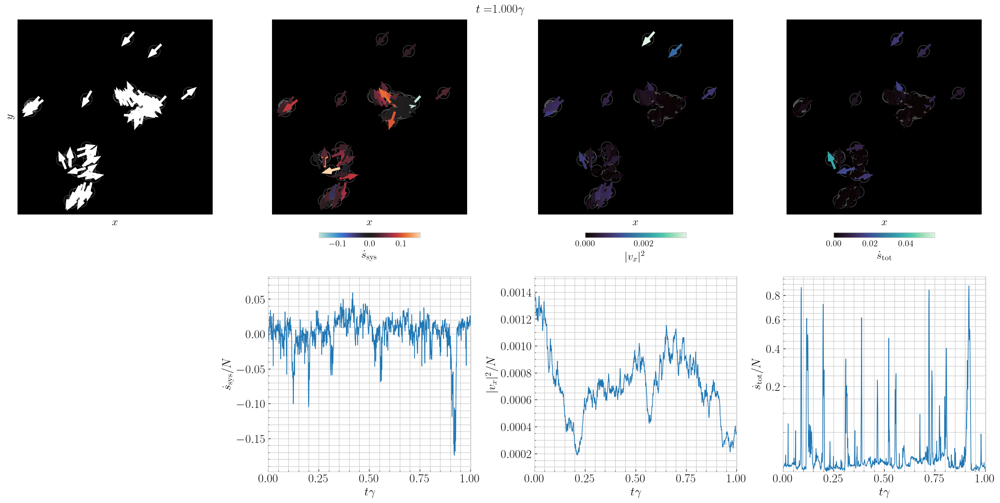

In [25]:
make_entropy_movie_time_series(
    traj=sde_movie_traj[::sde_skip],
    div_vs=div_vs,
    xdots=xdots,
    gdots=gdots,
    nframes=500,
    clip_quantile=0.025,
    skip=sde_skip,
    output_folder=figure_output,
    output_name=f'sde_entropy_movie_plot',
    cfg=cfg,
    plot_gdots=False
)

In [ ]:
make_entropy_movie_time_series(
    traj=sde_movie_traj[::sde_skip],
    div_vs=div_vs,
    gdots=gdots,
    nframes=3500,
    clip_quantile=0.025,
    skip=sde_skip,
    output_folder=figure_output,
    output_name=f'sde_entropy_movie_plot_long',
    cfg=cfg,
    plot_gdots=False
)

Finished animation on frame 0/3500. Time: 5.874909162521362s.
Finished animation on frame 350/3500. Time: 866.3066561222076s.
Finished animation on frame 700/3500. Time: 1747.8541994094849s.
Finished animation on frame 1050/3500. Time: 2641.630450487137s.
Finished animation on frame 1400/3500. Time: 3551.323851108551s.
Finished animation on frame 1750/3500. Time: 4457.996982097626s.
Finished animation on frame 2100/3500. Time: 5364.856848955154s.


In [ ]:
make_entropy_movie_time_series_g_space(
    traj=sde_movie_traj[::sde_skip],
    div_vs=div_vs,
    xdots=xdots,
    gdots=gdots,
    nframes=500,
    clip_quantile=0.05,
    skip=sde_skip,
    output_folder=figure_output,
    output_name=f'sde_entropy_movie_gspace',
    cfg=cfg,
)

# Intermittency Analysis

## Generate data

In [58]:
psd_traj = generate_trajectory(
    nbatches=100,
    thermalize_fac=5.0,
    tf_fac=10.0,
    N=cfg.N,
    phi=cfg.phi,
    cfg=cfg
)

  0%|          | 0/100 [00:00<?, ?it/s]

Filling in the boundary case: (200001, 200002)
Finished generating trajectory.


In [61]:
psd_skip = 20

psd_div_vs, psd_xdots, psd_gdots = calc_learned_quantities(
    params=ema_params[0.9999],
    traj=psd_traj[::psd_skip],
    nbatches_compute=1000,
    net=net
)

bs: 10, total samples: 10001


  0%|          | 0/1000 [00:00<?, ?it/s]

KeyboardInterrupt: 

## Visualization and fits

In [56]:
from scipy import signal, stats, optimize


## power law y axis without weird negative square root issue
def power_transform(x: np.ndarray, power: float):
    return np.where(x > 0, np.power(x, power), 0)


def power_law(x: np.ndarray, a: float, b: float):
    return a * x**(-b)


def make_time_series_and_psd_plot(
    fw: float,
    fh: float,
    time_array: np.ndarray,
    data: np.ndarray,
    cfg: object,
    skip: int,
    fit_skip: int,
    ylabel: str,
    scale_power: float,
    nonlinear_fit: bool,
    color: str = 'C0',
    output_folder: Optional[str] = None,
    save_name: str = ""
) -> Tuple[plt.Figure, plt.Axes]:
    plt.close('all')
    
    # Set up basic figure properties
    fontsize = 20

    with sns.axes_style('whitegrid'):
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(2*fw, fh))
    
        # Plot time series data
        ax1.plot(time_array, data, lw=0.75, zorder=0, color=color)
    
        # Set labels and limits for time series plot
        ax1.set_xlabel(r'$t\gamma$', fontsize=fontsize)
        ax1.set_ylabel(ylabel, fontsize=fontsize)
        # ax1.set_xlim([time_array[0], time_array[-1]])
    
        # Customize ticks and spines for time series plot
        ax1.tick_params(which='both', direction='in', labelsize=fontsize, color='k', width=0.25)
    
        # Adjust grid for time series plot
        ax1.grid(which='both', alpha=0.3)

        if scale_power != 1.0:
            ax1.set_yscale(
                mpl.scale.FuncScale(
                    axis=ax1.yaxis, 
                    functions=(lambda x: power_transform(x, scale_power), lambda x: power_transform(x, 1.0 / scale_power))
                )
            )
        
        # Calculate and plot power spectral density
        # f, Pxx = signal.periodogram(onp.array(data), fs=float(1/(time_array[1]-time_array[0])))
        nperseg = data.shape[0] // 100
        f, Pxx = signal.welch(
            onp.array(data),
            nperseg=nperseg,
            noverlap=nperseg//2,
            average='median',
            fs=float(1/(time_array[1]-time_array[0]))
        )

        # avoid annoying scaling of the figure
        if Pxx[0] < 1e-8:
            Pxx[0] = np.nan

        # plot PSD
        ax2.loglog(f, Pxx, color=color, lw=1.0)

        if nonlinear_fit:
            popt, _ = optimize.curve_fit(power_law, f[fit_skip:], Pxx[fit_skip:], p0=[1.0, 2.0])
            a, b = popt
            ax2.plot(f[fit_skip:], power_law(f[fit_skip:], a, b), color='C4', lw=1.5, ls='--', label=rf"$p={b:.2f}$")
        else:
            slope, intercept, r_value, p_value, std_err = stats.linregress(np.log(f[fit_skip:]), np.log(Pxx[fit_skip:]))
            print(f'slope: {slope}, intercept: {intercept}, r_value: {r_value}, p_value: {p_value}, std_err: {std_err}')
            ax2.plot(f[fit_skip:], np.exp(intercept) / f[fit_skip:]**(-slope), color='C4', lw=1.5, ls='--', label=rf"$p={-slope:.02f}$")
        
        # Set labels and limits for PSD plot
        ax2.set_xlabel('frequency', fontsize=fontsize)
        ax2.set_ylabel('PSD', fontsize=fontsize)
        ax2.legend(loc='best')
        
        # Customize ticks and spines for PSD plot
        ax2.tick_params(which='both', direction='in', labelsize=fontsize, color='k', width=0.25)
        
        # Adjust grid for PSD plot
        ax2.grid(which='both', alpha=0.3)
    
        plt.tight_layout()
    
    if save_name:
        if output_folder:
            save_path = f"{output_folder}/{save_name}.pdf"
        else:
            save_path = f"{save_name}.pdf"
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"Saved to {save_path}")
    else:
        plt.show()
    return fig, (ax1, ax2)

Saved to /scratch/nb3397/results/strato/vicsek/7_22_24/figures/9_8_24/sdot_sys_psd_nlin.pdf


(<Figure size 2000x625 with 2 Axes>,
 (<Axes: xlabel='$t\\gamma$', ylabel='$\\dot{s}_{\\text{sys}} / N$'>,
  <Axes: xlabel='frequency', ylabel='PSD'>))

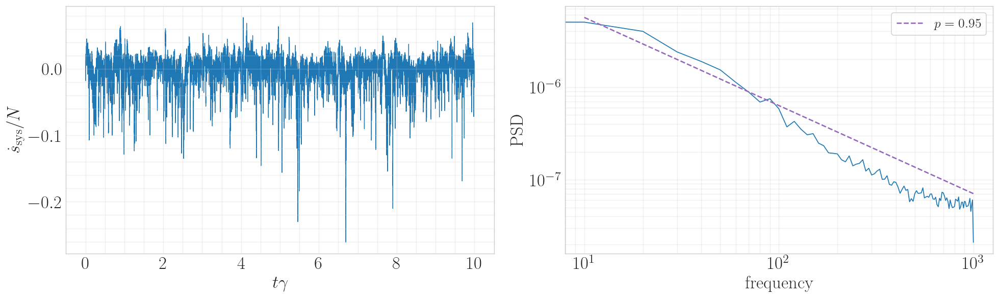

In [84]:
ts = np.arange(psd_div_vs.shape[0]) * cfg.dt * cfg.gamma * psd_skip
ds_fac = 10

make_time_series_and_psd_plot(
    fw=8,
    fh=5,
    time_array=ts[::psd_skip*ds_fac],
    data=np.sum(psd_div_vs[::ds_fac], axis=-1) / cfg.N,
    cfg=cfg,
    skip=psd_skip,
    fit_skip=1,
    scale_power=1.0,
    ylabel=r"$\dot{s}_{\text{sys}} / N$",
    color='C0',
    nonlinear_fit=True,
    output_folder=figure_output,
    save_name='sdot_sys_psd_nlin'
)

slope: -1.089592066530967, intercept: -9.538304783796795, r_value: -0.978662543153593, p_value: 3.669441541844293e-69, std_err: 0.023108679115093848
Saved to /scratch/nb3397/results/strato/vicsek/7_22_24/figures/9_8_24/sdot_sys_psd_lin.pdf


(<Figure size 2000x625 with 2 Axes>,
 (<Axes: xlabel='$t\\gamma$', ylabel='$\\dot{s}_{\\text{sys}} / N$'>,
  <Axes: xlabel='frequency', ylabel='PSD'>))

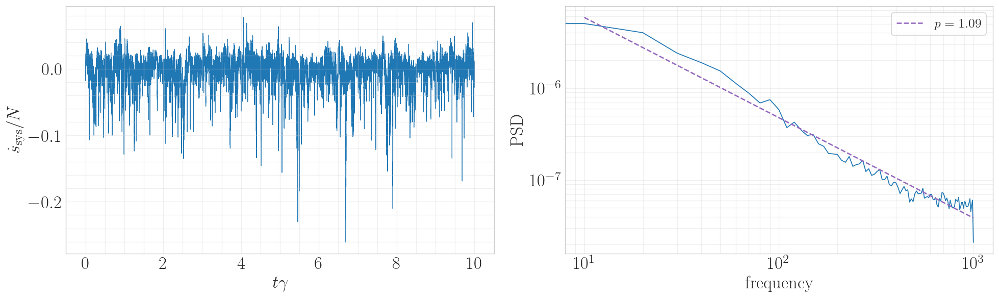

In [85]:
ts = np.arange(psd_div_vs.shape[0]) * cfg.dt * cfg.gamma * psd_skip

make_time_series_and_psd_plot(
    fw=8,
    fh=5,
    time_array=ts[::psd_skip*ds_fac],
    data=np.sum(psd_div_vs[::ds_fac], axis=-1) / cfg.N,
    cfg=cfg,
    skip=psd_skip,
    fit_skip=1,
    scale_power=1.0,
    ylabel=r"$\dot{s}_{\text{sys}} / N$",
    color='C0',
    nonlinear_fit=False,
    output_folder=figure_output,
    save_name='sdot_sys_psd_lin'
)

Saved to /scratch/nb3397/results/strato/vicsek/7_22_24/figures/9_8_24/sdot_tot_psd_nlin.pdf


(<Figure size 2000x625 with 2 Axes>,
 (<Axes: xlabel='$t\\gamma$', ylabel='$\\dot{s}_{\\text{tot}} / N$'>,
  <Axes: xlabel='frequency', ylabel='PSD'>))

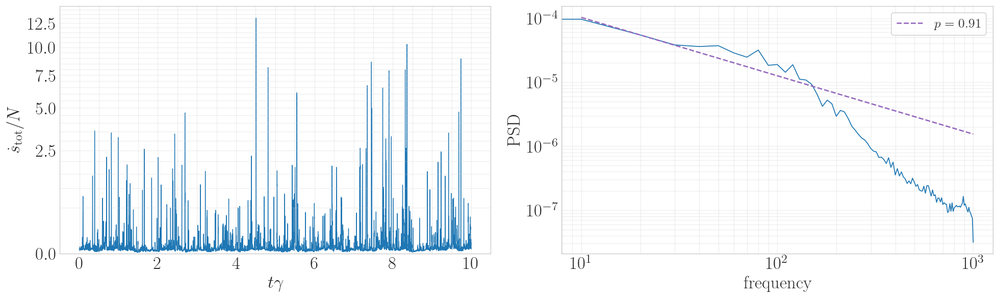

In [90]:
make_time_series_and_psd_plot(
    fw=8,
    fh=5,
    time_array=ts[::psd_skip*ds_fac],
    data=np.sum(psd_gdots[::ds_fac]**2, axis=(-1, -2)) / cfg.N,
    cfg=cfg,
    skip=psd_skip,
    fit_skip=1,
    scale_power=0.5,
    ylabel=r"$\dot{s}_{\text{tot}} / N$",
    color='C0',
    nonlinear_fit=True,
    output_folder=figure_output,
    save_name='sdot_tot_psd_nlin'
)

slope: -2.029885330638703, intercept: -2.3265796713519684, r_value: -0.9711058420021967, p_value: 8.673015323204251e-63, std_err: 0.05039087442112015
Saved to /scratch/nb3397/results/strato/vicsek/7_22_24/figures/9_8_24/sdot_tot_psd_lin.pdf


(<Figure size 2000x625 with 2 Axes>,
 (<Axes: xlabel='$t\\gamma$', ylabel='$\\dot{s}_{\\text{tot}} / N$'>,
  <Axes: xlabel='frequency', ylabel='PSD'>))

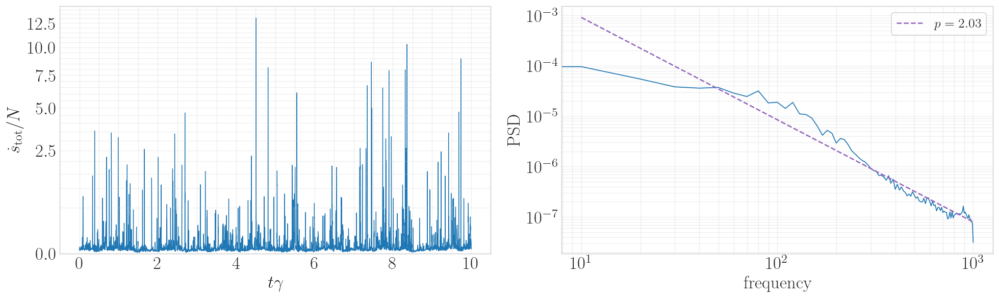

In [91]:
make_time_series_and_psd_plot(
    fw=8,
    fh=5,
    time_array=ts[::psd_skip*ds_fac],
    data=np.sum(psd_gdots[::ds_fac]**2, axis=(-1, -2)) / cfg.N,
    cfg=cfg,
    skip=psd_skip,
    fit_skip=1,
    scale_power=0.5,
    ylabel=r"$\dot{s}_{\text{tot}} / N$",
    color='C0',
    nonlinear_fit=False,
    output_folder=figure_output,
    save_name='sdot_tot_psd_lin'
)

Saved to /scratch/nb3397/results/strato/vicsek/7_22_24/figures/9_8_24/xdot_tot_psd_nlin.pdf


(<Figure size 2000x625 with 2 Axes>,
 (<Axes: xlabel='$t\\gamma$', ylabel='$|\\dot{x}|^2 / N$'>,
  <Axes: xlabel='frequency', ylabel='PSD'>))

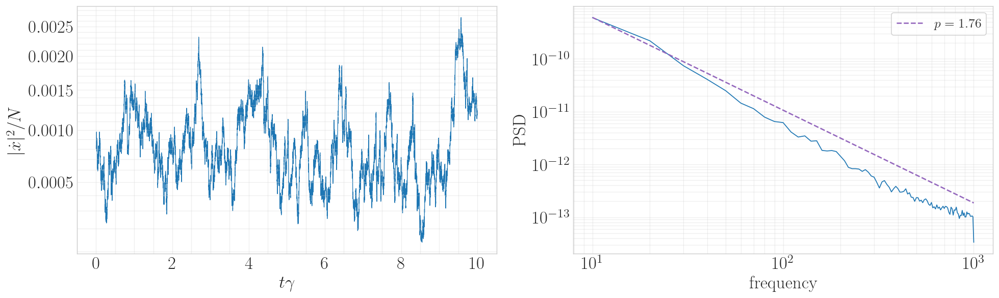

In [92]:
make_time_series_and_psd_plot(
    fw=8,
    fh=5,
    time_array=ts[::psd_skip*ds_fac],
    data=np.sum(psd_data['xdots'][::ds_fac]**2, axis=(-1, -2)) / cfg.N,
    cfg=cfg,
    skip=psd_skip,
    fit_skip=1,
    scale_power=0.5,
    ylabel=r"$|\dot{x}|^2 / N$",
    color='C0',
    nonlinear_fit=True,
    output_folder=figure_output,
    save_name='xdot_tot_psd_nlin'
)

slope: -1.8882135671958753, intercept: -17.237046326010095, r_value: -0.9914743479178922, p_value: 1.493057346962563e-88, std_err: 0.025067311328369698
Saved to /scratch/nb3397/results/strato/vicsek/7_22_24/figures/9_8_24/xdot_tot_psd_lin.pdf


(<Figure size 2000x625 with 2 Axes>,
 (<Axes: xlabel='$t\\gamma$', ylabel='$|\\dot{x}|^2 / N$'>,
  <Axes: xlabel='frequency', ylabel='PSD'>))

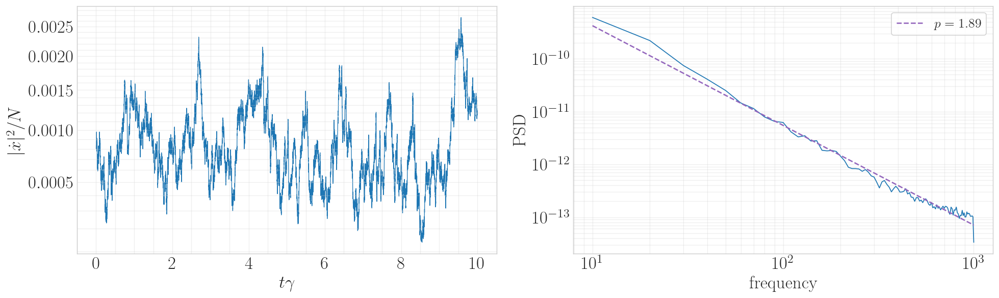

In [93]:
make_time_series_and_psd_plot(
    fw=8,
    fh=5,
    time_array=ts[::psd_skip*ds_fac],
    data=np.sum(psd_data['xdots'][::ds_fac]**2, axis=(-1, -2)) / cfg.N,
    cfg=cfg,
    skip=psd_skip,
    fit_skip=1,
    scale_power=0.5,
    ylabel=r"$|\dot{x}|^2 / N$",
    color='C0',
    nonlinear_fit=False,
    output_folder=figure_output,
    save_name='xdot_tot_psd_lin'
)

## Waiting time analysis

In [69]:
from scipy.signal import find_peaks
from scipy.signal import savgol_filter


def identify_peaks(
    quantity: np.ndarray,
    lower_percentile: float,
    upper_percentile: float,
    distance: int,
    savgol_window_length: int,
    savgol_poly_order: int,
) -> np.ndarray:

    ## filter + find_peaks based solution
    # filter the signal to help the prominence calculation
    # quantity = savgol_filter(quantity, window_length=savgol_window_length, polyorder=savgol_poly_order)

    # identify the peaks
    peaks, _ = find_peaks(
        quantity, 
        distance=distance,
        prominence=np.percentile(quantity, upper_percentile) - np.percentile(quantity, lower_percentile)
    )

    ## simple magnitude based solution
    return peaks


peak_indices  = {}

lower_percentiles = {
    'div_v': 50,
    'gdot': 50,
}

upper_percentiles = {
    'div_v': 90,
    'gdot': 90,
}

quantities = {
    'div_v': np.abs(np.sum(psd_div_vs, axis=-1)),
    'gdot': np.sum(psd_gdots**2, axis=(-1, -2))
}

for key in quantities.keys():
    peak_indices[key] = identify_peaks(
        quantities[key],
        lower_percentiles[key],
        upper_percentiles[key],
        distance=1,
        savgol_window_length=21,
        savgol_poly_order=3
    )

    print(f'Finished {key}.')

Finished div_v.
Finished gdot.


In [70]:
def visualize_signal_with_peaks(
    time_array: np.ndarray,
    data: np.ndarray,
    peak_indices: np.ndarray,
    lower_percentile: float,
    upper_percentile: float,
    fw: float = 24,  # Doubled the width to accommodate two columns
    fh: float = 6,
    ylabel: str = '',
    color: str = 'C0',
    output_folder: Optional[str] = None,
    save_name: str = "",
    savgol_window: int = 21,
    savgol_order: int = 3
) -> plt.Figure:
    plt.close('all')
    
    # Convert jax arrays to numpy for matplotlib compatibility
    time_array_np = onp.array(time_array)
    data_np = onp.array(data)
    peak_indices_np = onp.array(peak_indices)
    
    # Apply Savitzky-Golay filter
    data_filtered = np.exp(savgol_filter(np.log(data_np), window_length=savgol_window, polyorder=savgol_order))
    
    # Set up basic figure properties
    fontsize = 20
    with sns.axes_style('whitegrid'):
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(fw, fh), constrained_layout=True, sharey=True)
    
        for kk, (ax, data_to_plot, title) in enumerate(
            zip([ax1, ax2], [data_np, data_filtered], ['original', 'filtered'])
        ):
            # Plot time series data
            ax.plot(time_array_np, data_to_plot, lw=0.75, zorder=0, color=color)
        
            # Plot peak locations
            ax.vlines(time_array_np[peak_indices_np], ymin=ax.get_ylim()[0], ymax=ax.get_ylim()[1], 
                      colors='black', linestyles='dashed', lw=0.5, alpha=0.5)
        
            # Plot percentile thresholds
            lower_threshold = onp.percentile(data_to_plot, lower_percentile)
            upper_threshold = onp.percentile(data_to_plot, upper_percentile)

            print(lower_threshold, upper_threshold)
            ax.axhline(y=lower_threshold, color='black', linestyle='dashed', lw=1.0, alpha=1.0, 
                       label=f'{lower_percentile}th percentile')
            ax.axhline(y=upper_threshold, color='black', linestyle='dashed', lw=1.0, alpha=1.0, 
                       label=f'{upper_percentile}th percentile')
        
            # Set labels and limits
            ax.set_xlabel(r'$t\gamma$', fontsize=fontsize)

            if kk == 0:
                ax.set_ylabel(ylabel, fontsize=fontsize)
            ax.set_xlim([time_array_np[0], time_array_np[-1]])
        
            # Customize ticks and spines
            ax.tick_params(which='both', direction='in', labelsize=fontsize, color='k', width=0.25)
        
            # Adjust grid
            ax.grid(which='both', alpha=0.3)
            
            # Add title
            ax.set_title(title, fontsize=fontsize)
        
    if save_name:
        if output_folder:
            save_path = f"{output_folder}/{save_name}.pdf"
        else:
            save_path = f"{save_name}.pdf"
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"Saved to {save_path}")
    else:
        plt.show()
    
    return fig

0.010523064527660608 0.03421294689178467
0.008936757687479258 0.03181750439107418


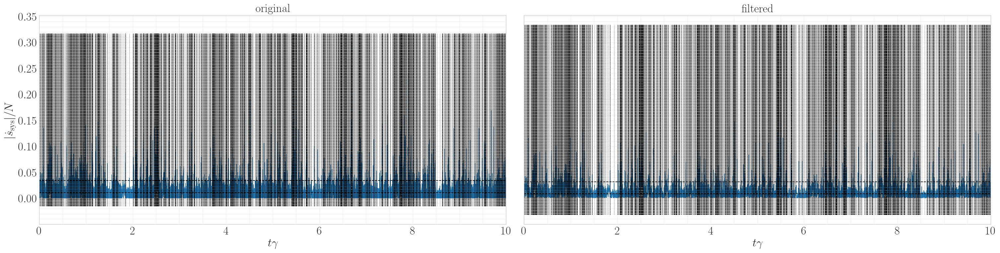

In [71]:
_ = visualize_signal_with_peaks(
    ts[::psd_skip],
    quantities['div_v'] / cfg.N,
    peak_indices['div_v'],
    lower_percentiles['div_v'],
    upper_percentiles['div_v'],
    ylabel=r"$|\dot{s}_{\text{sys}}| / N$",
    save_name='',
    savgol_window=21,
    savgol_order=3
)

0.00497126579284668 0.0684381365776062
0.004980095662176609 0.0667081087827682


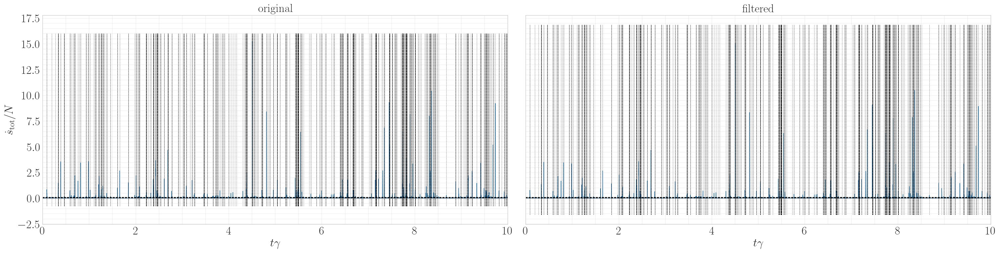

In [72]:
# For gdot
_ = visualize_signal_with_peaks(
    ts[::psd_skip],
    quantities['gdot'] / cfg.N,
    peak_indices['gdot'],
    lower_percentiles['gdot'],
    upper_percentiles['gdot'],
    ylabel=r"$\dot{s}_{\text{tot}} / N$",
    save_name='',
    savgol_window=21,
    savgol_order=3
)

In [105]:
def plot_waiting_time_distributions(
    waiting_times: Dict,
    bins: int = 50,
    fw: float = 6,
    fh: float = 6,
    logscale: bool = False,
    output_folder: Optional[str] = None,
    save_name: str = ""
) -> plt.Figure:
    plt.close('all')
    
    # Set up basic figure properties
    fontsize = 14
    with sns.axes_style('whitegrid'):
        fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(2*fw, fh), constrained_layout=True, sharey=False)
        
        # Plot div(v) waiting time distribution
        ax1.hist(waiting_times['div_v'], bins=bins)
        ax1.set_xlabel(r"waiting time $\tau$", fontsize=fontsize)
        ax1.set_ylabel('count', fontsize=fontsize)
        ax1.set_title(r"$\dot{s}_{\text{sys}}$", fontsize=fontsize)
        
        # Plot |dot{g}| waiting time distribution
        ax2.hist(waiting_times['gdot'], bins=bins)
        ax2.set_xlabel(r"waiting time $\tau$", fontsize=fontsize)
        ax2.set_ylabel('count', fontsize=fontsize)
        ax2.set_title(r'$\dot{s}_{\text{tot}}$', fontsize=fontsize)

        if logscale:
            ax1.set_yscale('log')
            ax2.set_yscale('log')
        
        # Adjust tick parameters for both axes
        for ax in [ax1, ax2]:
            ax.tick_params(which='both', direction='in', labelsize=fontsize-2)
            ax.grid(which='both', alpha=0.3)
    
    if save_name:
        if output_folder:
            save_path = f"{output_folder}/{save_name}.pdf"
        else:
            save_path = f"{save_name}.pdf"
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"Saved to {save_path}")
    else:
        plt.show()

Saved to /scratch/nb3397/results/strato/vicsek/7_22_24/figures/9_8_24/psd_hists.pdf


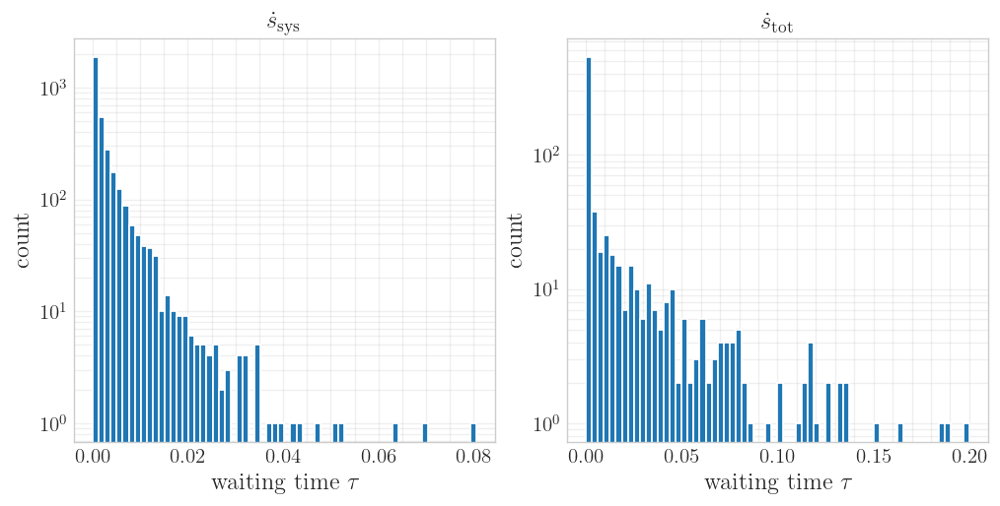

In [109]:
## compute waiting times
waiting_times = {key: np.diff(value * cfg.dt * cfg.gamma * psd_skip) for key, value in peak_indices.items()}

plot_waiting_time_distributions(
    waiting_times,
    bins=64,
    fw=4,
    fh=4,
    logscale=True,
    output_folder=figure_output,
    save_name='psd_hists'
    # save_name=''
)

# Still frames

### Frame selection

In [13]:
def adaptive_frame_selection(
    quantity: np.ndarray,
    nframes: int, 
    points_per_peak: int = 1,
    min_distance: int = 50,
    initial_prominence_percentile: float = 95,
    window_size: int = 0
) -> np.ndarray:
    from scipy.signal import find_peaks
    from scipy.signal import savgol_filter

    # filter to help the prominence calculation
    quantity = savgol_filter(quantity, window_length=21, polyorder=3)

    def get_prominence(percentile):
        return np.percentile(quantity, percentile) - np.percentile(quantity, 25)
        # return np.percentile(quantity, percentile) - quantity.min()

    prominence = get_prominence(initial_prominence_percentile)
    peaks, _ = find_peaks(quantity, distance=min_distance, prominence=prominence, threshold=np.std(quantity))

    if len(peaks) < nframes:
        # If we have too few peaks, gradually lower the prominence
        while len(peaks) < nframes and initial_prominence_percentile > 50:
            initial_prominence_percentile -= 5
            prominence = get_prominence(initial_prominence_percentile)
            peaks, _ = find_peaks(quantity, distance=min_distance, prominence=prominence)

    elif len(peaks) > nframes:
        # If we have too many peaks, gradually increase the prominence
        while len(peaks) > nframes and initial_prominence_percentile < 100:
            initial_prominence_percentile += 5
            prominence = get_prominence(initial_prominence_percentile)
            peaks, _ = find_peaks(quantity, distance=min_distance, prominence=prominence)

    print(f'Final prominence percentile: {initial_prominence_percentile}.')

    # Initialize selected frames
    selected_frames = set(peaks)

    # If we haven't selected enough frames, add more
    remaining_frames = nframes - len(selected_frames)
    if remaining_frames > 0:
        print('Selected additional frames.')
        potential_frames = set(range(len(quantity))) - selected_frames
        additional_frames = onp.random.choice(list(potential_frames), 
                                             size=min(remaining_frames, len(potential_frames)), 
                                             replace=False)
        selected_frames.update(additional_frames)

    # If we've selected too many frames, subsample
    if len(selected_frames) > nframes:
        print('Subsampling.')
        selected_frames = set(onp.random.choice(list(selected_frames), size=nframes, replace=False))

    return np.array(sorted(selected_frames))


nframes = 6
frames  = {}
keys    = ['div_vs', 'xdots', 'gdots']
for key in keys:
    if key == 'div_vs':
        quantity = np.sum(np.abs(div_vs), axis=-1)
        nframes_find = nframes
    # elif key == 'neg_div_vs':
    #     quantity = np.sum(np.abs(div_vs), axis=-1)
    #     nframes_find = nframes
    elif key == 'xdots':
        quantity = np.linalg.norm(xdots, axis=(-1, -2))**2
        nframes_find = nframes
    else:
        quantity = np.linalg.norm(gdots, axis=(-1, -2))**2
        nframes_find = nframes
        
    frames[key] = np.array(
        adaptive_frame_selection(
            quantity,
            nframes_find, 
            points_per_peak=1,
            window_size=0,
            min_distance=50,
            initial_prominence_percentile=95
        )
    )

    print(f'Finished {key}.')

# frames['div_vs'] = np.concatenate((frames['pos_div_vs'], frames['neg_div_vs']))

Final prominence percentile: 90.
Subsampling.
Finished div_vs.
Final prominence percentile: 50.
Selected additional frames.
Finished xdots.
Final prominence percentile: 90.
Subsampling.
Finished gdots.


### Individual figures

#### Time series

In [14]:
## power law y axis without weird negative square root issue
def power_transform(x: np.ndarray, power: float):
    return np.where(x > 0, np.power(x, power), 0)

def make_single_time_series_plot(
    fw: float,
    fh: float,
    time_array: np.ndarray,
    data: np.ndarray,
    frames: List[int],
    cfg: object,
    skip: int,
    ylabel: str,
    scale_power: float,
    color: str = 'C0',
    output_folder: Optional[str] = None,
    save_name: str = ""
) -> Tuple[plt.Figure, plt.Axes]:
    plt.close('all')

    # Set up basic figure properties
    fontsize = 16

    with sns.axes_style('whitegrid'):
        fig, ax = plt.subplots(figsize=(fw, fh))
    
        # Plot time series data
        ax.plot(time_array, data, lw=0.75, zorder=0, color=color)
    
        # Set labels and limits
        ax.set_xlabel(r'$t\gamma$', fontsize=fontsize)
        ax.set_ylabel(ylabel, fontsize=fontsize)
    
        # Customize ticks and spines
        ax.tick_params(which='both', direction='in', labelsize=fontsize, color='k', width=0.25)
    
        # Add vertical lines for frames
        frame_times = frames * cfg.dt * cfg.gamma * skip
        for frame_time in frame_times:
            ax.axvline(x=frame_time, color='k', linewidth=0.75, linestyle='--', alpha=0.75)

        # power law scaling
        if scale_power != 1.0:
            ax.set_yscale(
                mpl.scale.FuncScale(
                    axis=ax.yaxis, 
                    functions=(lambda x: power_transform(x, scale_power), lambda x: power_transform(x, 1.0 / scale_power))
                )
            )
    
        # adjust grid
        ax.grid(which='both', alpha=0.3)

        # fix weird y-axis scaling
        ax.autoscale()
        plt.tight_layout()

    if save_name:
        if output_folder:
            save_path = f"{output_folder}/{save_name}.pdf"
        else:
            save_path = f"{save_name}.pdf"
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"Saved to {save_path}")
    else:
        plt.show()

    return fig, ax

Saved to /scratch/nb3397/results/strato/vicsek/7_22_24/figures/9_8_24/sdot_sys_time_series.pdf


(<Figure size 1125x562.5 with 1 Axes>,
 <Axes: xlabel='$t\\gamma$', ylabel='$\\dot{s}_{\\text{sys}}$'>)

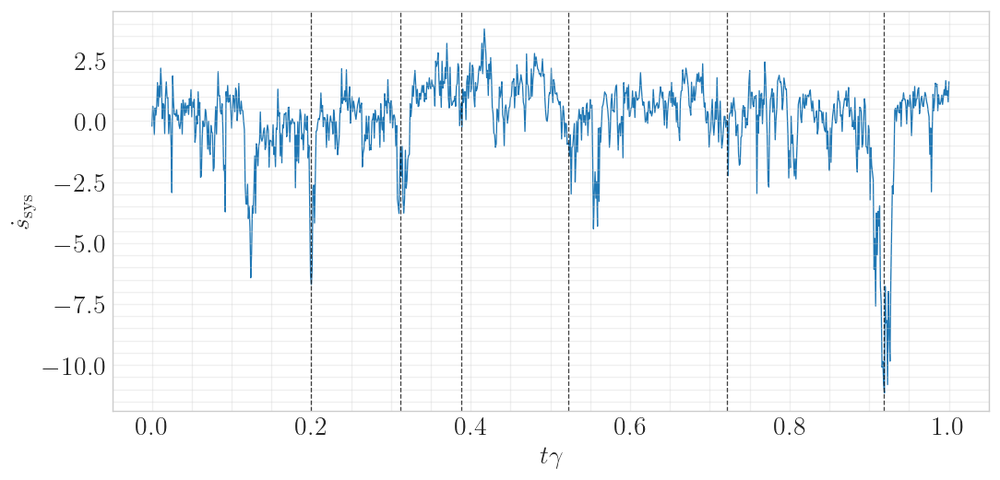

In [15]:
ts = np.arange(sde_movie_traj.shape[0]) * cfg.dt * cfg.gamma

make_single_time_series_plot(
    fw=9,
    fh=4.5,
    time_array=ts[::sde_skip],
    data=np.sum(div_vs, axis=-1),
    frames=frames['gdots'],
    cfg=cfg,
    skip=sde_skip,
    ylabel=r"$\dot{s}_{\text{sys}}$",
    scale_power=1.0,
    color='C0',
    output_folder=figure_output,
    save_name='sdot_sys_time_series',
)

Saved to /scratch/nb3397/results/strato/vicsek/7_22_24/figures/9_8_24/sdot_tot_time_series.pdf


(<Figure size 1125x562.5 with 1 Axes>,
 <Axes: xlabel='$t\\gamma$', ylabel='$\\dot{s}_{\\text{tot}}$'>)

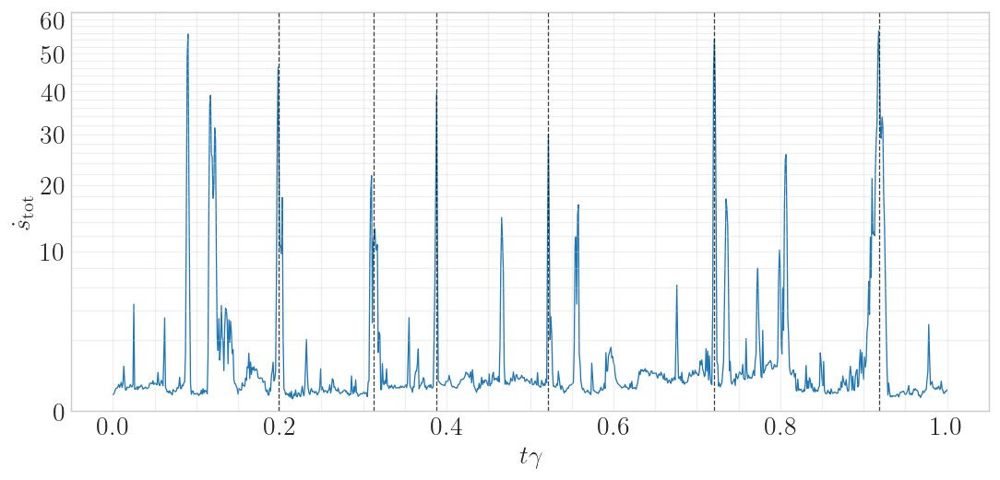

In [16]:
make_single_time_series_plot(
    fw=9,
    fh=4.5,
    time_array=ts[::sde_skip],
    data=np.sum(gdots**2, axis=(-1, -2)),
    frames=frames['gdots'],
    cfg=cfg,
    skip=sde_skip,
    ylabel=r"$\dot{s}_{\text{tot}}$",
    scale_power=0.5,
    color='C0',
    output_folder=figure_output,
    save_name='sdot_tot_time_series'
)

Saved to /scratch/nb3397/results/strato/vicsek/7_22_24/figures/9_8_24/xdot_time_series.pdf


(<Figure size 1125x562.5 with 1 Axes>,
 <Axes: xlabel='$t\\gamma$', ylabel='$|v_x|^2$'>)

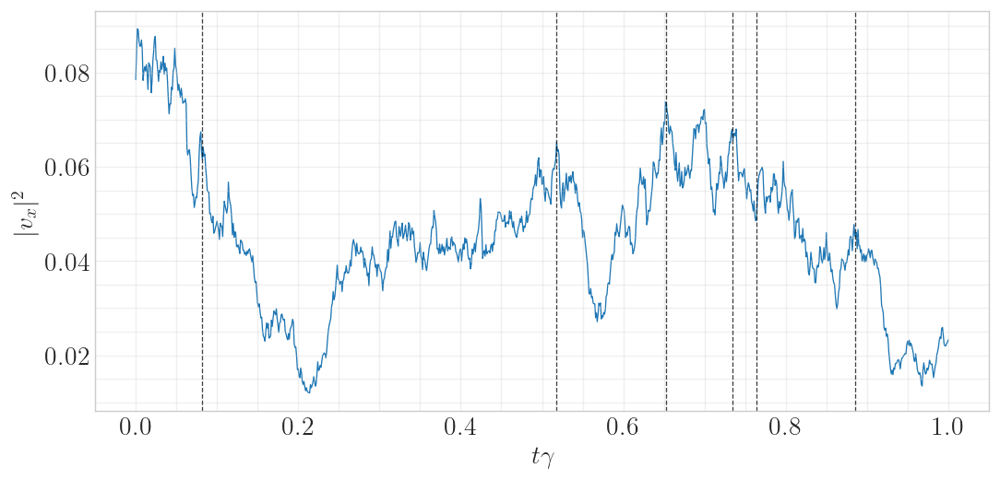

In [17]:
make_single_time_series_plot(
    fw=9,
    fh=4.5,
    time_array=ts[::sde_skip],
    data=np.sum(xdots**2, axis=(-1, -2)),
    frames=frames['xdots'],
    cfg=cfg,
    skip=sde_skip,
    ylabel=r"$|v_x|^2$",
    color='C0',
    scale_power=1.0,
    output_folder=figure_output,
    save_name='xdot_time_series'
)

### Still frames

#### Single row

In [33]:
def make_single_row_still_frames(
    fw: float,
    fh: float,
    traj: np.ndarray,
    color_data: np.ndarray,
    frames: List[int],
    clip_quantile: float,
    skip: int,
    cfg: object,
    cmap_name: str,
    colorbar_label: str = "",
    output_folder: Optional[str] = None,
    save_name: str = "",
    nframes: int = 1,
    frame_skip: int = 1
) -> Tuple[plt.Figure, List[plt.Axes]]:
    plt.close('all')
    # Set up basic figure properties
    fontsize = 20
    ncols = len(frames)
    
    # Create figure and axes
    fig, axs = plt.subplots(1, ncols, figsize=(fw * ncols, fh), constrained_layout=True)
    if ncols == 1:
        axs = [axs]
    
    # Set up colormap and normalization
    if cmap_name == 'custom_div':
        cmap = custom_div
    else:
        cmap = sns.color_palette(cmap_name, as_cmap=True)
    vmin = np.quantile(color_data, clip_quantile)
    vmax = np.quantile(color_data, 1-clip_quantile)
    norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax, clip=True)
    
    # Set up particle panels
    for col in range(ncols):
        ax = axs[col]
        ax.set_xlim([-cfg.width, cfg.width])
        ax.set_ylim([-cfg.width, cfg.width])
        ax.set_aspect(1.0)
        ax.set_facecolor('k')
        ax.set_xticks([])
        ax.set_yticks([])
        for spine in ax.spines.values():
            spine.set_edgecolor(None)
    scale = axs[0].transData.get_matrix()[0, 0]
    
    # Plot frames
    for col, frame in enumerate(frames):
        ax = axs[col]
        
        # Calculate start and end frames for the trace
        start_frame = max(0, frame - nframes*frame_skip)
        end_frame = min(traj.shape[0] - 1, frame + nframes*frame_skip)
        
        # Plot traces with fading opacity
        for kk, i in enumerate(range(start_frame, end_frame, frame_skip)):
            xs, gs = np.split(traj[i], 2)
            gs = gs / np.linalg.norm(gs, axis=1, keepdims=True)
            
            frame_color_data = color_data[i]
            colors = cmap(norm(frame_color_data))
            
            # Calculate opacity based on distance from the main frame
            alpha = 0.1 + 0.9 / (2*nframes) * kk
            
            ax.quiver(
                xs[:, 0], xs[:, 1], gs[:, 0], gs[:, 1],
                angles='xy', scale_units='xy', scale=5,
                color=colors, pivot='mid', alpha=alpha,
                headwidth=3, headlength=4, width=0.0075,
                # width=0.004, headwidth=3, headlength=4,
            )
            ax.scatter(
                xs[:, 0], xs[:, 1],
                s=cfg.r**2 * scale**2,
                facecolors='none',
                edgecolors='white',
                alpha=0.1,
                zorder=0,
                lw=0.25
            )
        
        t = frame * cfg.dt * cfg.gamma * skip
        # ax.set_title(rf"$t={t:.2f}\gamma$", fontsize=fontsize)
    
    # Add colorbar
    mappable = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    mappable.set_array([])
    cb = fig.colorbar(mappable, ax=axs, orientation='vertical', pad=0.005, shrink=0.8)
    cb.set_label(colorbar_label, fontsize=fontsize)
    cb.ax.tick_params(labelsize=fontsize, which='both', direction='in', length=0)
    
    if save_name:
        if output_folder:
            save_path = f"{output_folder}/{save_name}.pdf"
        else:
            save_path = f"{save_name}.pdf"
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"Saved to {save_path}")
    else:
        plt.show()
    
    return fig, axs

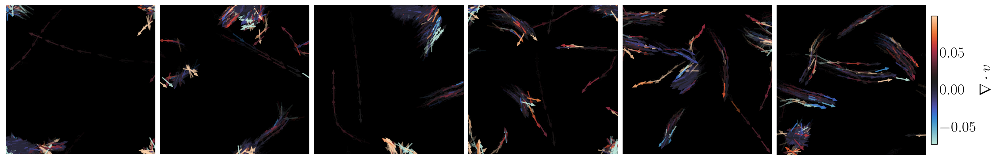

In [34]:
fig, axs = make_single_row_still_frames(
    fw=3, 
    fh=3, 
    traj=sde_movie_traj[::sde_skip], 
    color_data=div_vs, 
    frames=frames['div_vs'], 
    clip_quantile=0.05, 
    skip=sde_skip, 
    cfg=cfg, 
    cmap_name="icefire", 
    colorbar_label=r"$\nabla \cdot v$",
    output_folder=figure_output,
    # save_name='div_v_frames
    save_name='',
    nframes=4,
    frame_skip=10,
)

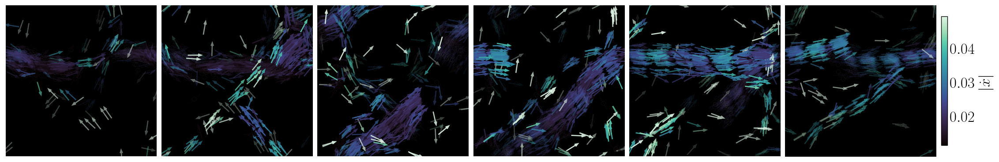

In [324]:
fig, axs = make_single_row_still_frames(
    fw=3, 
    fh=3, 
    traj=sde_movie_traj[::sde_skip], 
    color_data=np.linalg.norm(xdots, axis=-1), 
    frames=frames['xdots'], 
    clip_quantile=0.05, 
    skip=sde_skip, 
    cfg=cfg, 
    cmap_name="mako", 
    colorbar_label=r"$|\dot{x}|$",
    output_folder=figure_output,
    # save_name='xdot_frames'
    nframes=6,
    frame_skip=50,
    save_name='',
)

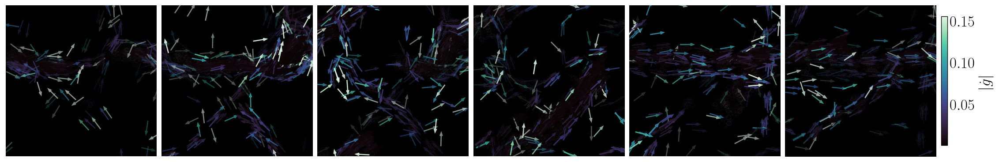

In [325]:
fig, axs = make_single_row_still_frames(
    fw=3, 
    fh=3, 
    traj=sde_movie_traj[::sde_skip], 
    color_data=np.linalg.norm(gdots, axis=-1), 
    frames=frames['gdots'], 
    clip_quantile=0.05, 
    skip=sde_skip, 
    cfg=cfg, 
    cmap_name="mako", 
    colorbar_label=r"$|\dot{g}|$",
    output_folder=figure_output,
    # save_name='gdot_frames'
    nframes=6,
    frame_skip=50,
    save_name=''
)

#### multirow

In [6]:
def make_multirow_still_frames(
    fw: float,
    fh: float,
    traj: np.ndarray,
    color_data: List[np.ndarray],
    frames: List[np.ndarray],
    clip_quantile: float,
    skip: int,
    cfg: object,
    cmap_name: List[str],
    colorbar_label: List[str],
    plot_xs: bool,
    output_folder: Optional[str] = None,
    save_name: str = "",
    nframes: int = 1,  # Parameter for trace length
    frame_skip: int = 1  # New parameter for skipping frames in the trace
) -> Tuple[plt.Figure, List[plt.Axes]]:
    plt.close('all')

    # Set up basic figure properties
    fontsize = 20
    nrows = len(frames)
    ncols = len(frames[0])
 
    # Create figure and axes
    fig, axs = plt.subplots(
        nrows, 
        ncols, 
        figsize=(fw * ncols, fh * nrows), 
        constrained_layout=True,
        sharex=True,
        sharey=True
    )
    axs = axs.reshape((nrows, ncols))

    for curr_row in range(nrows):
        # Set up colormap and normalization
        if curr_row > 0:
            cmap = sns.color_palette(cmap_name[curr_row], as_cmap=True)
            vmin = np.quantile(color_data[curr_row], clip_quantile)
            vmax = np.quantile(color_data[curr_row], 1-clip_quantile)
    
            if vmin < 0:
                vmin = min(vmin, -vmax)
                vmax = max(-vmin, vmax)
        
            norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax, clip=True)
    
        # Set up particle panels
        for col in range(ncols):
            ax = axs[curr_row, col]

            if plot_xs:
                ax.set_xlim([-cfg.width, cfg.width])
                ax.set_ylim([-cfg.width, cfg.width])
                ax.set_aspect(1.0)

            ax.set_facecolor('k')
            ax.set_xticks([])
            ax.set_yticks([])
            for spine in ax.spines.values():
                spine.set_edgecolor(None)
    
        scale = ax.transData.get_matrix()[0, 0]
    
        # Plot frames
        for col, frame in enumerate(frames[curr_row]):
            ax = axs[curr_row, col]
            
            # Calculate start and end frames for the trace
            start_frame = max(0, frame - nframes*frame_skip)
            end_frame = min(traj.shape[0] - 1, frame + nframes*frame_skip)
            
            # Plot traces with fading opacity
            for kk, i in enumerate(range(start_frame, end_frame + 1, frame_skip)):
                xs, gs = np.split(traj[i], 2)

                frame_color_data = color_data[curr_row][i]

                if curr_row > 0:
                    colors = cmap(norm(frame_color_data))
                else:
                    colors = 'white'
                
                # Calculate opacity based on distance from the main frame
                opacity = float((kk / (2*nframes)))

                if plot_xs:
                    gs = gs / np.linalg.norm(gs, axis=1, keepdims=True)

                    ax.quiver(
                        xs[:, 0], xs[:, 1], gs[:, 0], gs[:, 1],
                        angles='xy', scale_units='xy', scale=5,
                        color=colors, pivot='mid', alpha=opacity,
                        width=0.0125, headwidth=3, headlength=4
                    )

                    ax.scatter(
                        xs[:, 0], xs[:, 1],
                        s=np.pi * cfg.r**2 * scale**2,
                        facecolors='none',
                        edgecolors='white',
                        alpha=opacity * 0.25,
                        zorder=0,
                        lw=0.25
                    )

                    if col == 0:
                        ax.set_ylabel(r"$y$", fontsize=fontsize)
                    if curr_row == nrows-1:
                        ax.set_xlabel(r"$x$", fontsize=fontsize)
                else:
                    ax.scatter(
                        gs[:, 0], gs[:, 1],
                        s=20,
                        c=colors,
                        alpha=opacity
                    )

                    if col == 0:
                        ax.set_ylabel(r"$g_y$", fontsize=fontsize)
                    if curr_row == nrows-1:
                        ax.set_xlabel(r"$g_x$", fontsize=fontsize)    
            
            t = frame * cfg.dt * cfg.gamma * skip
            # ax.set_title(rf"$t={t:.2f}\gamma$", fontsize=fontsize)
    
        if curr_row > 0:
            mappable = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
            mappable.set_array([])
            cb = fig.colorbar(mappable, ax=axs[curr_row, :], orientation='vertical', pad=0.02, shrink=0.8)
            cb.set_label(colorbar_label[curr_row], fontsize=fontsize, labelpad=10)
            cb.ax.tick_params(labelsize=fontsize, which='both', direction='in', length=0)

    if save_name:
        if output_folder:
            save_path = f"{output_folder}/{save_name}.pdf"
        else:
            save_path = f"{save_name}.pdf"
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"Saved to {save_path}")
    else:
        plt.show()

    return fig, axs

In [18]:
def split_segments(segments: np.ndarray, colors: np.ndarray):
    """fix periodic wrapping"""
    new_segments = []
    new_colors = []
    
    for segment, color in zip(segments, colors):
        start, end = segment

        ## compute indices where wrapping was necessary
        test_ind = np.where(np.abs(end - start) > cfg.width)[0]
        opp_ind = np.where(np.abs(end - start) <= cfg.width)[0]

        ## if we need to wrap...
        if test_ind.size > 0:
            mid1, mid2 = onp.zeros_like(start), onp.zeros_like(start)

            # compute clamps to each boundary -- just average the fixed index for simplicity (should do weighted averaged based on arc length)
            mid1[test_ind] = onp.sign(start[test_ind] - end[test_ind]) * cfg.width
            mid2[test_ind] = -onp.sign(start[test_ind] - end[test_ind]) * cfg.width
            mid1[opp_ind] = 0.5 * (start[opp_ind] + end[opp_ind])
            mid2[opp_ind] = 0.5 * (start[opp_ind] + end[opp_ind])

            # make a new segment that hits the midpoint before wrapping
            seg1 = np.array([start, mid1])
            seg2 = np.array([mid2, end])

            ## add the segments for visualization
            new_segments.append(seg1)
            new_segments.append(seg2)
            new_colors.append(color)
            new_colors.append(color)
        else:
            new_segments.append(segment)
            new_colors.append(color)
        
    return new_segments, new_colors

def make_multirow_still_frames(
    fw: float,
    fh: float,
    traj: np.ndarray,
    color_data: List[np.ndarray],
    frames: List[np.ndarray],
    clip_quantile: float,
    skip: int,
    cfg: object,
    cmap_name: List[str],
    colorbar_label: List[str],
    plot_xs: bool,
    output_folder: Optional[str] = None,
    save_name: str = "",
    nframes: int = 1,  # Parameter for trace length
    frame_skip: int = 1  # New parameter for skipping frames in the trace
) -> Tuple[plt.Figure, List[plt.Axes]]:
    plt.close('all')

    # Set up basic figure properties
    fontsize = 20
    nrows = len(frames)
    ncols = len(frames[0])
 
    # Create figure and axes
    fig, axs = plt.subplots(
        nrows, 
        ncols, 
        figsize=(fw * ncols, fh * nrows), 
        constrained_layout=True,
        sharex=True,
        sharey=True
    )
    axs = axs.reshape((nrows, ncols))

    for curr_row in range(nrows):
        # Set up colormap and normalization
        if curr_row > 0:
            cmap = sns.color_palette(cmap_name[curr_row], as_cmap=True)
            vmin = np.quantile(color_data[curr_row], clip_quantile)
            vmax = np.quantile(color_data[curr_row], 1-clip_quantile)
    
            if vmin < 0:
                vmin = min(vmin, -vmax)
                vmax = max(-vmin, vmax)
        
            norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax, clip=True)
    
        # Set up particle panels
        for col in range(ncols):
            ax = axs[curr_row, col]

            if plot_xs:
                ax.set_xlim([-cfg.width, cfg.width])
                ax.set_ylim([-cfg.width, cfg.width])
                ax.set_aspect(1.0)

            ax.set_facecolor('k')
            ax.set_xticks([])
            ax.set_yticks([])
            for spine in ax.spines.values():
                spine.set_edgecolor(None)
    
        scale = ax.transData.get_matrix()[0, 0]
    
        # Plot frames
        for col, frame in enumerate(frames[curr_row]):
            ax = axs[curr_row, col]
            
            # Calculate start and end frames for the trace
            start_frame = max(0, frame - nframes*frame_skip)
            end_frame = min(traj.shape[0] - 1, frame + nframes*frame_skip)
            
            # Plot traces with fading opacity
            plot_frames = range(start_frame, end_frame + 1, frame_skip)
            for kk, i in enumerate(plot_frames):
                xs, gs = np.split(traj[i], 2)

                frame_color_data = color_data[curr_row][i]

                if curr_row > 0:
                    colors = cmap(norm(frame_color_data))
                else:
                    colors = ['white'] * cfg.N
                
                # Calculate opacity based on distance from the main frame
                opacity = float((kk / (2*nframes)))

                if plot_xs:
                    gs = gs / np.linalg.norm(gs, axis=1, keepdims=True)

                    if kk == len(plot_frames)-1:
                        ax.quiver(
                            xs[:, 0], xs[:, 1], gs[:, 0], gs[:, 1],
                            angles='xy', scale_units='xy', scale=5,
                            color=colors, pivot='mid', alpha=opacity,
                            width=0.0125, headwidth=3, headlength=4,
                            zorder=kk
                        )
                    else:
                        xnexts, _ = np.split(traj[plot_frames[kk+1]], 2)
                        segments = np.stack((xs, xnexts), axis=1)
                        segments, colors = split_segments(segments, colors)
                            
                        lc = mpl.collections.LineCollection(
                            segments, colors=colors, linewidths=2.5, alpha=opacity, zorder=kk
                        )
                        ax.add_collection(lc)

                        # ax.plot(
                        #     [xs[:, 0], xnexts[:, 0]], [xs[:, 1], xnexts[:, 1]],
                        #     color='white',
                        #     lw=0.5, alpha=opacity
                        # )

                    # ax.scatter(
                    #     xs[:, 0], xs[:, 1],
                    #     s=np.pi * cfg.r**2 * scale**2,
                    #     facecolors='none',
                    #     edgecolors='white',
                    #     alpha=opacity * 0.25,
                    #     zorder=0,
                    #     lw=0.25
                    # )

                    if col == 0:
                        ax.set_ylabel(r"$y$", fontsize=fontsize)
                    if curr_row == nrows-1:
                        ax.set_xlabel(r"$x$", fontsize=fontsize)
                else:
                    ax.scatter(
                        gs[:, 0], gs[:, 1],
                        s=20,
                        c=colors,
                        alpha=opacity
                    )

                    if col == 0:
                        ax.set_ylabel(r"$g_y$", fontsize=fontsize)
                    if curr_row == nrows-1:
                        ax.set_xlabel(r"$g_x$", fontsize=fontsize)    

            print(f'Finished row {curr_row+1}/{nrows} and col {col+1}/{ncols}')
            t = frame * cfg.dt * cfg.gamma * skip
            # ax.set_title(rf"$t={t:.2f}\gamma$", fontsize=fontsize)
    

        # Add colorbar
        if curr_row > 0:
            mappable = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
            mappable.set_array([])
            cb = fig.colorbar(mappable, ax=axs[curr_row, :], orientation='vertical', pad=0.02, shrink=0.8)
            cb.set_label(colorbar_label[curr_row], fontsize=fontsize, labelpad=10)
            cb.ax.tick_params(labelsize=fontsize, which='both', direction='in', length=0)


    if save_name:
        if output_folder:
            save_path = f"{output_folder}/{save_name}.pdf"
        else:
            save_path = f"{save_name}.pdf"
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"Saved to {save_path}")
    else:
        plt.show()

    return fig, axs

Finished row 1/3 and col 1/6
Finished row 1/3 and col 2/6
Finished row 1/3 and col 3/6
Finished row 1/3 and col 4/6
Finished row 1/3 and col 5/6
Finished row 1/3 and col 6/6
Finished row 2/3 and col 1/6
Finished row 2/3 and col 2/6
Finished row 2/3 and col 3/6
Finished row 2/3 and col 4/6
Finished row 2/3 and col 5/6
Finished row 2/3 and col 6/6
Finished row 3/3 and col 1/6
Finished row 3/3 and col 2/6
Finished row 3/3 and col 3/6
Finished row 3/3 and col 4/6
Finished row 3/3 and col 5/6
Finished row 3/3 and col 6/6
Saved to /scratch/nb3397/results/strato/vicsek/7_22_24/figures/9_8_24/sdot_frames_nframes=25.pdf
Finished row 1/3 and col 1/6
Finished row 1/3 and col 2/6
Finished row 1/3 and col 3/6
Finished row 1/3 and col 4/6
Finished row 1/3 and col 5/6
Finished row 1/3 and col 6/6
Finished row 2/3 and col 1/6
Finished row 2/3 and col 2/6
Finished row 2/3 and col 3/6
Finished row 2/3 and col 4/6
Finished row 2/3 and col 5/6
Finished row 2/3 and col 6/6
Finished row 3/3 and col 1/6
Fini

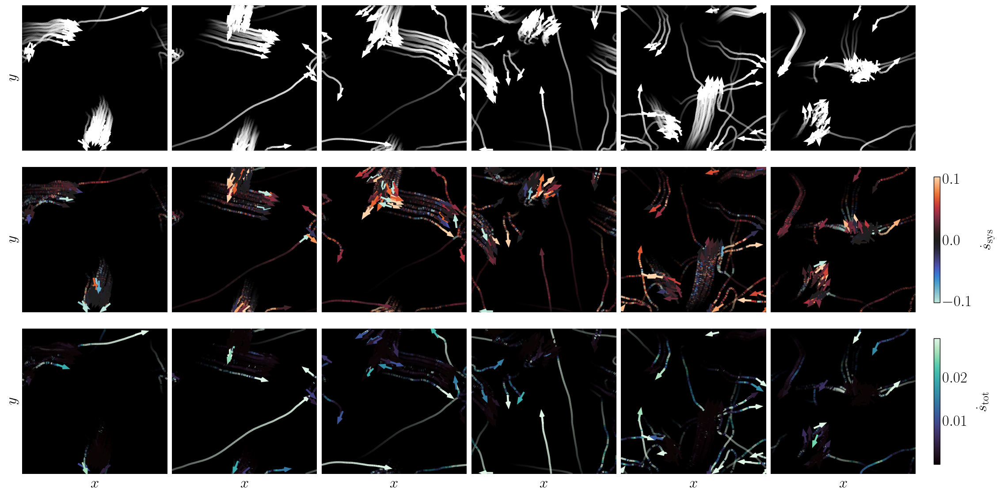

In [21]:
for nframes in [25, 50, 75]:
    make_multirow_still_frames(
        fw=3,
        fh=3,
        traj=sde_movie_traj[::sde_skip],
        color_data=[np.ones_like(div_vs), div_vs, np.sum(gdots**2, axis=-1)],
        frames=[frames['gdots'], frames['gdots'], frames['gdots']],
        clip_quantile=0.05,
        skip=sde_skip,
        cfg=cfg,
        cmap_name=[None, 'icefire', 'mako'],
        colorbar_label=[None, r"$\dot{s}_{\text{sys}}$", r"$\dot{s}_{\text{tot}}$"],
        plot_xs=True,
        output_folder=figure_output,
        save_name=f'sdot_frames_nframes={nframes}',
        nframes=nframes,
        frame_skip=1,
        # save_name=''
    )

In [ ]:
make_multirow_still_frames(
    fw=3,
    fh=3,
    traj=sde_movie_traj[::sde_skip],
    color_data=[div_vs, np.sum(gdots**2, axis=-1)],
    frames=[frames['gdots'], frames['gdots']],
    clip_quantile=0.025,
    skip=sde_skip,
    cfg=cfg,
    cmap_name=['icefire', 'mako'],
    colorbar_label=[r"$\dot{s}_{\text{sys}}$", r"$\dot{s}_{\text{tot}}$"],
    plot_xs=False,
    output_folder=figure_output,
    save_name='sdot_frames_gspace',
    nframes=50,
    frame_skip=10,
    # save_name=''
)

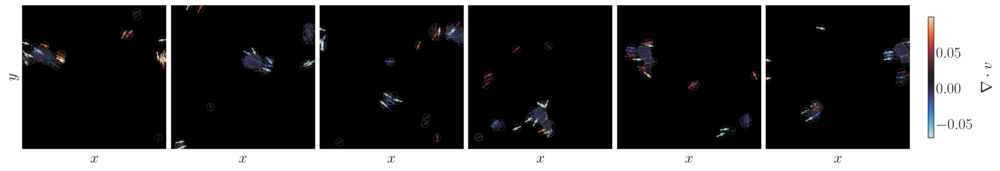

(<Figure size 2250x375 with 7 Axes>,
 array([[<Axes: xlabel='$x$', ylabel='$y$'>, <Axes: xlabel='$x$'>,
         <Axes: xlabel='$x$'>, <Axes: xlabel='$x$'>, <Axes: xlabel='$x$'>,
         <Axes: xlabel='$x$'>]], dtype=object))

In [331]:
make_multirow_still_frames(
    fw=3,
    fh=3,
    traj=sde_movie_traj[::sde_skip],
    color_data=[div_vs],
    frames=[frames['div_vs']],
    clip_quantile=0.05,
    skip=sde_skip,
    cfg=cfg,
    cmap_name=['icefire'],
    colorbar_label=[r"$\nabla \cdot v$"],
    plot_xs=True,
    output_folder=figure_output,
    # save_name='div_v_frames'
    save_name=''
)

Saved to /scratch/nb3397/results/strato/vicsek/7_22_24/figures/div_v_frames_gspace.pdf


(<Figure size 2250x375 with 7 Axes>,
 array([[<Axes: xlabel='$g_x$', ylabel='$g_y$'>, <Axes: xlabel='$g_x$'>,
         <Axes: xlabel='$g_x$'>, <Axes: xlabel='$g_x$'>,
         <Axes: xlabel='$g_x$'>, <Axes: xlabel='$g_x$'>]], dtype=object))

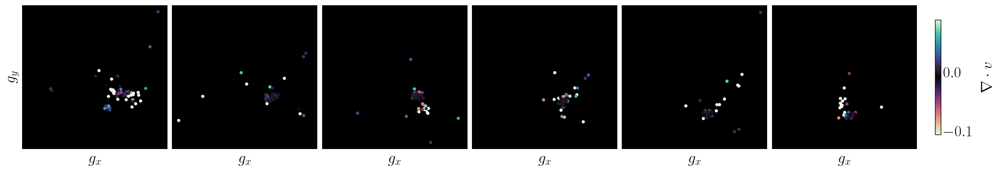

In [136]:
make_multirow_still_frames(
    fw=3,
    fh=3,
    traj=sde_movie_traj[::sde_skip],
    color_data=[div_vs],
    frames=[frames['div_vs']],
    clip_quantile=0.05,
    skip=sde_skip,
    cfg=cfg,
    cmap_name=['custom_div'],
    colorbar_label=[r"$\nabla \cdot v$"],
    plot_xs=False,
    output_folder=figure_output,
    save_name='div_v_frames_gspace'
    # save_name=''
)

Saved to /scratch/nb3397/results/strato/vicsek/7_22_24/figures/xdot_frames.pdf


(<Figure size 2250x375 with 7 Axes>,
 array([[<Axes: xlabel='$x$', ylabel='$y$'>, <Axes: xlabel='$x$'>,
         <Axes: xlabel='$x$'>, <Axes: xlabel='$x$'>, <Axes: xlabel='$x$'>,
         <Axes: xlabel='$x$'>]], dtype=object))

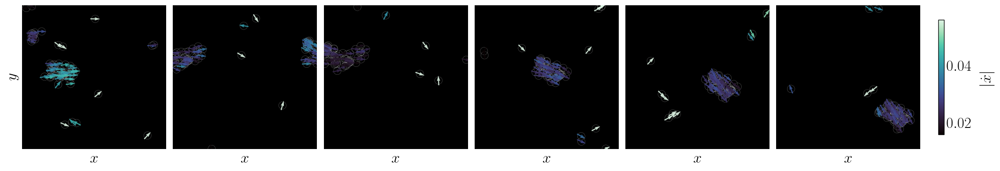

In [137]:
make_multirow_still_frames(
    fw=3,
    fh=3,
    traj=sde_movie_traj[::sde_skip],
    color_data=[np.linalg.norm(xdots, axis=-1)],
    frames=[frames['xdots']],
    clip_quantile=0.05,
    skip=sde_skip,
    cfg=cfg,
    cmap_name=['mako'],
    colorbar_label=[r"$|\dot{x}|$"],
    plot_xs=True,
    output_folder=figure_output,
    save_name='xdot_frames'
    # save_name=''
)

Saved to /scratch/nb3397/results/strato/vicsek/7_22_24/figures/xdot_frames_gspace.pdf


(<Figure size 2250x375 with 7 Axes>,
 array([[<Axes: xlabel='$g_x$', ylabel='$g_y$'>, <Axes: xlabel='$g_x$'>,
         <Axes: xlabel='$g_x$'>, <Axes: xlabel='$g_x$'>,
         <Axes: xlabel='$g_x$'>, <Axes: xlabel='$g_x$'>]], dtype=object))

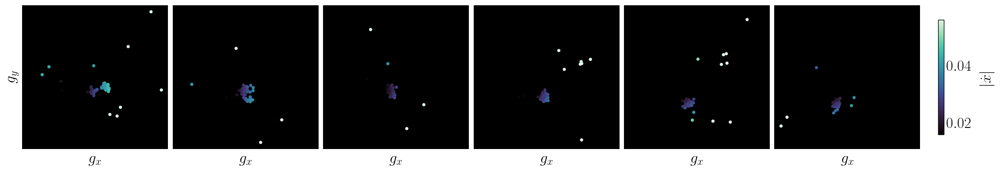

In [138]:
make_multirow_still_frames(
    fw=3,
    fh=3,
    traj=sde_movie_traj[::sde_skip],
    color_data=[np.linalg.norm(xdots, axis=-1)],
    frames=[frames['xdots']],
    clip_quantile=0.05,
    skip=sde_skip,
    cfg=cfg,
    cmap_name=['mako'],
    colorbar_label=[r"$|\dot{x}|$"],
    plot_xs=False,
    output_folder=figure_output,
    save_name='xdot_frames_gspace'
    # save_name=''
)

Saved to /scratch/nb3397/results/strato/vicsek/7_22_24/figures/gdot_frames.pdf


(<Figure size 2250x375 with 7 Axes>,
 array([[<Axes: xlabel='$x$', ylabel='$y$'>, <Axes: xlabel='$x$'>,
         <Axes: xlabel='$x$'>, <Axes: xlabel='$x$'>, <Axes: xlabel='$x$'>,
         <Axes: xlabel='$x$'>]], dtype=object))

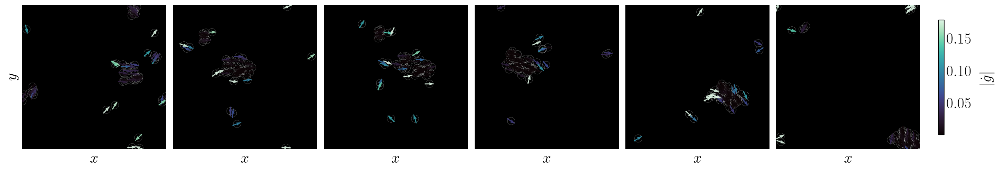

In [139]:
make_multirow_still_frames(
    fw=3,
    fh=3,
    traj=sde_movie_traj[::sde_skip],
    color_data=[np.linalg.norm(gdots, axis=-1)],
    frames=[frames['gdots']],
    clip_quantile=0.05,
    skip=sde_skip,
    cfg=cfg,
    cmap_name=['mako'],
    colorbar_label=[r"$|\dot{g}|$"],
    plot_xs=True,
    output_folder=figure_output,
    save_name='gdot_frames'
    # save_name=''
)

Saved to /scratch/nb3397/results/strato/vicsek/7_22_24/figures/gdot_frames_gspace.pdf


(<Figure size 2250x375 with 7 Axes>,
 array([[<Axes: xlabel='$g_x$', ylabel='$g_y$'>, <Axes: xlabel='$g_x$'>,
         <Axes: xlabel='$g_x$'>, <Axes: xlabel='$g_x$'>,
         <Axes: xlabel='$g_x$'>, <Axes: xlabel='$g_x$'>]], dtype=object))

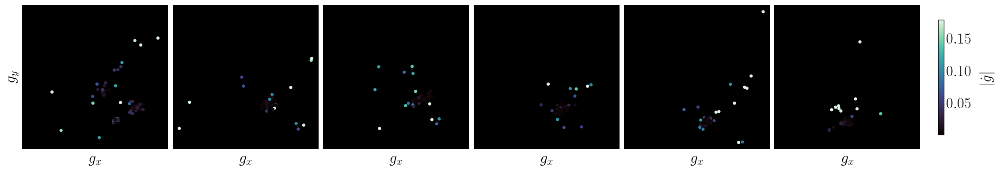

In [140]:
make_multirow_still_frames(
    fw=3,
    fh=3,
    traj=sde_movie_traj[::sde_skip],
    color_data=[np.linalg.norm(gdots, axis=-1)],
    frames=[frames['gdots']],
    clip_quantile=0.05,
    skip=sde_skip,
    cfg=cfg,
    cmap_name=['mako'],
    colorbar_label=[r"$|\dot{g}|$"],
    plot_xs=False,
    output_folder=figure_output,
    save_name='gdot_frames_gspace'
    # save_name=''
)

### Combined figure

In [136]:
def make_entropy_still_frames(
    fw: float,
    fh: float,
    traj: np.ndarray,
    div_vs: np.ndarray,
    xdots: np.ndarray,
    gdots: np.ndarray,
    frames: Dict[str, np.ndarray],
    clip_quantile: float,
    skip: int,
    output_folder: str,
    output_name: str,
    cfg: ml_collections.FrozenConfigDict,
    plot_dynamics: bool = True,
    plot_xdot: bool = True
) -> None:
    plt.close('all')

    # Set up basic figure properties
    fontsize = 12
    lw = 0.5
    nrows = 2 + plot_dynamics + plot_xdot + 1  # Adjust row count based on flags
    ncols = max(len(frames[key]) for key in frames)

    # create figure and gridspec
    fig = plt.figure(figsize=(fw * ncols, fh * (nrows + 0.5)))

    # Keep the original height ratios, but adjust the colorbar axes later
    gs = fig.add_gridspec(nrows + 1, ncols + 1, width_ratios=[1]*ncols + [0.05], height_ratios=[1]*nrows + [1.0])

    # Create axes for particle visualizations
    axs = [[fig.add_subplot(gs[i, j]) for j in range(ncols)] for i in range(nrows - 1)]

    # Create axes for time series (centered, spanning the width)
    if plot_xdot:
        axs_ts = [fig.add_subplot(gs[-2, i*ncols//3:(i+1)*ncols//3]) for i in range(3)]
    else:
        axs_ts = [fig.add_subplot(gs[-2, :ncols//2]), fig.add_subplot(gs[-2, ncols//2:ncols])]

    # Create axes for colorbars
    if plot_dynamics:
        cbar_axs = [fig.add_subplot(gs[i, -1]) for i in range(1, nrows - 1)]
    else:
        cbar_axs = [fig.add_subplot(gs[i, -1]) for i in range(0, nrows - 1)]

    # Define variables to be visualized
    xdot_norms = np.linalg.norm(xdots, axis=-1)
    gdot_norms = np.linalg.norm(gdots, axis=-1)
    quantities = ([None] if plot_dynamics else []) + [div_vs] + ([xdot_norms] if plot_xdot else []) + [gdot_norms]
    titles = ([None] if plot_dynamics else []) + [r"$\nabla \cdot v$"] + ([r"$|\dot{x}|$"] if plot_xdot else []) + [r"$|\dot{g}|$"]
    cmaps = ([None] if plot_dynamics else []) \
    + [custom_div] \
    + ([sns.color_palette("mako", as_cmap=True)] if plot_xdot else []) \
    + [sns.color_palette("mako", as_cmap=True)]

    # Set up particle panels
    for row in range(nrows - 1):
        for col in range(ncols):
            ax = axs[row][col]
            ax.set_xlim([-cfg.width, cfg.width])
            ax.set_ylim([-cfg.width, cfg.width])
            ax.set_aspect(1.0)
            ax.set_facecolor('k')
            ax.set_xticks([])
            ax.set_yticks([])

            for spine in ax.spines.values():
                spine.set_edgecolor(None)
    scale = axs[0][0].transData.get_matrix()[0, 0]

    # set up time series plots
    N = div_vs.shape[1]
    total_div_vs = np.sum(div_vs, axis=1) / N
    total_gdot_norms = np.sqrt(np.sum(gdot_norms**2, axis=1) / N)
    total_xdot_norms = np.sqrt(np.sum(xdot_norms**2, axis=1) / N) if plot_xdot else None
    tmax = traj.shape[0] * cfg.dt * skip * cfg.gamma
    time_array = np.linspace(0, tmax, traj.shape[0])
    time_series_quantities = [total_div_vs] + ([total_xdot_norms] if plot_xdot else []) + [total_gdot_norms]
    time_series_titles = [r"$\nabla\cdot v / N$"] + ([r"$|\dot{x}| / \sqrt{N}$"] if plot_xdot else []) + [r"$|\dot{g}| / \sqrt{N}$"]

    for ax, data, title in zip(axs_ts, time_series_quantities, time_series_titles):
        if title == r"$\nabla\cdot v / N$":
            frame_times = frames['div_vs'] * cfg.dt * cfg.gamma * skip
            frame_data = data[frames['div_vs']]
        elif title == r"$|\dot{x}| / \sqrt{N}$":
            frame_times = frames['xdots'] * cfg.dt * cfg.gamma * skip
            frame_data = data[frames['xdots']]
        elif title == r"$|\dot{g}| / \sqrt{N}$":
            frame_times = frames['gdots'] * cfg.dt * cfg.gamma * skip
            frame_data = data[frames['gdots']]

        ax.plot(time_array, data, lw=lw, zorder=0, color='C0')
        ax.set_xlabel(r'$t\gamma$', fontsize=fontsize)
        # ax.set_ylabel(title, fontsize=fontsize)
        ax.set_title(title, fontsize=fontsize)
        ax.set_xlim([0, tmax])
        ax.tick_params(which='both', direction='in', labelsize=fontsize*0.8, color='#CCCCCC', width=0.25)
        for spine in ax.spines.values():
            # spine.set_edgecolor('#CCCCCC')
            spine.set_edgecolor('k')
            spine.set_linewidth(0.25)

        for frame_time, data_pt in zip(frame_times, frame_data):
            ax.axvline(x=frame_time, color='k', linewidth=0.5, linestyle='--')
        # ax.scatter(frame_times, frame_data, color='C1', s=2.5, zorder=1)
        ax.grid(which='both', alpha=0.25, linewidth=0.25)

    # compute global min and max for each quantity
    global_vmin = []
    global_vmax = []
    for row, quantity in enumerate(quantities):
        if quantity is not None:
            vmin = np.quantile(quantity, clip_quantile)
            vmax = np.quantile(quantity, 1-clip_quantile)

            if ((not plot_dynamics) and row == 0) or (plot_dynamics and row == 1): # div_v
                vmin = min(vmin, -vmax)
                vmax = max(vmax, -vmin)

        else:
            vmin, vmax = None, None

        global_vmin.append(vmin)
        global_vmax.append(vmax)

    # Create a mapping between row indices and frame keys
    if plot_dynamics and plot_xdots:
        row_to_key = {0: 'dynamics', 1: 'div_vs', 2: 'xdots', 3: 'gdots'}
    elif plot_dynamics:
        row_to_key = {0: 'dynamics', 1: 'div_vs', 2: 'gdots'}
    elif plot_xdot:
        row_to_key = {0: 'div_vs', 1: 'xdots', 2: 'gdots'}
    else:
        row_to_key = {0: 'div_vs', 1: 'gdots'}

    # Plot frames for each row
    for row in range(nrows - 1):
        key = row_to_key[row]
        row_frames = frames[key]
        
        for col, frame in enumerate(row_frames):
            ax = axs[row][col]
            xs, gs = np.split(traj[frame], 2)
            gs = jax.vmap(lambda g: g / np.linalg.norm(g))(gs)
            
            quantity = quantities[row]
            
            if quantity is not None:
                frame_quantity = quantity[frame]
                vmin = global_vmin[row]
                vmax = global_vmax[row]
                norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax, clip=True)
                cmap = cmaps[row]
                colors = cmap(norm(frame_quantity))
            else:
                colors = 'white'

            ax.quiver(
                xs[:, 0], xs[:, 1], gs[:, 0], gs[:, 1],
                angles='xy', scale_units='xy', scale=7.5,
                color=colors, pivot='mid', alpha=0.9,
            )

            ax.scatter(
                xs[:, 0], xs[:, 1],
                s=cfg.r**2 * scale**2,
                facecolors='none',
                edgecolors='white',
                alpha=0.1,
                zorder=0,
                lw=0.25
            )

            # Add time labels for each frame
            t = frame * cfg.dt * cfg.gamma * skip
            # ax.set_title(rf"$t={t:.2f}\gamma$", fontsize=fontsize)

        # Hide unused axes
        for col in range(len(row_frames), ncols):
            axs[row][col].axis('off')

    # Add colorbars
    for row, (vmin, vmax) in enumerate(zip(global_vmin, global_vmax), start=0):
        if vmin is not None:
            norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax, clip=True)
            mappable = mpl.cm.ScalarMappable(cmap=cmaps[row], norm=norm)
            mappable.set_array([])
            cbar = fig.colorbar(mappable, norm=norm, cax=cbar_axs[row-1 if plot_dynamics else row], shrink=0.5, fraction=0.25)
            cbar.set_label(titles[row], fontsize=fontsize)
            cbar.ax.tick_params(which='both', labelsize=0.8*fontsize, width=0, length=0)
            cbar.ax.set_xticks([])
            cbar.ax.set_yticks([])
            cbar.outline.set_edgecolor('k')
            cbar.outline.set_linewidth(0.25)

    # Adjust layout
    # plt.tight_layout(w_pad=0.0, h_pad=0.0, pad=0.25)
    plt.tight_layout()

    if output_name != '':
        plt.savefig(f'{output_folder}/{output_name}.pdf', dpi=300, bbox_inches='tight')
        print(f'Saved to {output_folder}/{output_name}.pdf')
    else:
        plt.show()

    plt.close(fig)

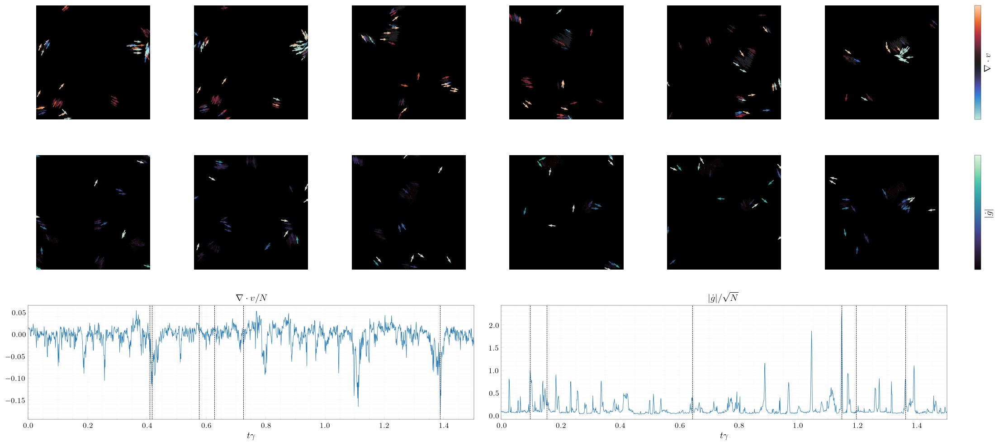

In [137]:
make_entropy_still_frames(
    fw=3.,
    fh=3.,
    plot_dynamics=False,
    plot_xdot=False,
    traj=sde_movie_traj[::sde_skip],
    div_vs=div_vs,
    xdots=xdots,
    gdots=gdots,
    frames=frames,
    clip_quantile=0.075,
    skip=sde_skip,
    output_folder=figure_output,
    # output_name='still_frame_panel',
    output_name='',
    cfg=cfg
)

# Simulate probability flow

In [ ]:
pflow_init = traj[-1]
gamma_fac = 1.0
tf = gamma_fac / cfg.gamma
nsteps_pflow = tf / cfg.dt_online

pflow_traj = pflow_utils.rollout_traj_pflow(
    pflow_init,
    ema_params[0.9999],
    cfg.system,
    cfg.loss_type,
    cfg.eps,
    cfg.gamma,
    net,
    cfg.dt_online,
    cfg.width,
    np.arange(nsteps_pflow)
)

In [ ]:
pflow_skip = 20

pflow_div_vs, pflow_xdots, pflow_gdots = calc_learned_quantities(
    params=ema_params[0.9999],
    traj=pflow_traj[::pflow_skip],
    nbatches_compute=50,
    net=net
)

### Make pflow movie

In [ ]:
make_entropy_movie_time_series(
    traj=pflow_traj[::sde_skip],
    div_vs=pflow_div_vs,
    xdots=pflow_xdots,
    gdots=pflow_gdots,
    nframes=500,
    clip_quantile=0.05,
    skip=pflow_skip,
    output_folder=figure_output,
    output_name=f'pflow_entropy_movie',
    cfg=cfg,
    plot_gdots=False
)

make_entropy_movie_time_series_g_space(
    traj=pflow_traj[::sde_skip],
    div_vs=pflow_div_vs,
    xdots=pflow_xdots,
    gdots=pflow_gdots,
    nframes=500,
    clip_quantile=0.05,
    skip=pflow_skip,
    output_folder=figure_output,
    output_name=f'pflow_entropy_movie_g_space',
    cfg=cfg,
    plot_gdots=False
)


Finished animation on frame 0/250. Time: 0.5342605113983154s.
Finished animation on frame 25/250. Time: 12.912553787231445s.
Finished animation on frame 50/250. Time: 25.44266986846924s.
Finished animation on frame 75/250. Time: 38.22178626060486s.
Finished animation on frame 100/250. Time: 50.988179206848145s.
Finished animation on frame 125/250. Time: 63.88266062736511s.
Finished animation on frame 150/250. Time: 76.77666068077087s.
Finished animation on frame 175/250. Time: 89.64146661758423s.
Finished animation on frame 200/250. Time: 102.61097121238708s.
Finished animation on frame 225/250. Time: 115.6623523235321s.
Saved to /scratch/nb3397/results/strato/vicsek/7_11_24/figures/pflow_entropy_movie_sum=1_share=0.mp4


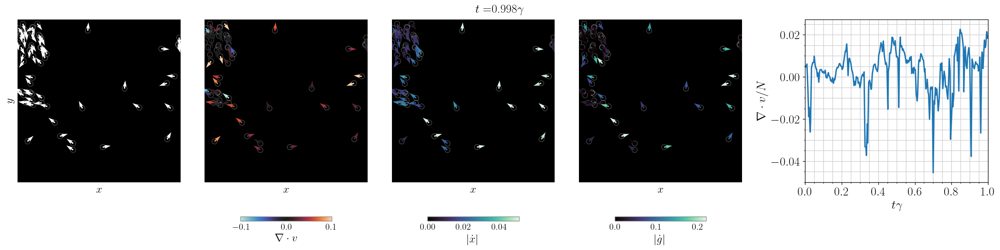

In [26]:
make_entropy_movie(
    params=ema_params[0.9999],
    traj=pflow_movie_traj,
    div_vs=pflow_div_vs,
    xdots=pflow_xdots,
    gdots=pflow_gdots,
    nframes=250,
    clip_quantile=0.025,
    skip=pflow_skip,
    output_folder=figure_output,
    output_name=f'pflow_entropy_movie_sum={cfg.sum_pool}_share={cfg.share_encoder}',
    cfg=cfg
)

# Distributions

In [13]:
def make_histograms(
    div_vs: np.ndarray,
    xdots: np.ndarray,
    gdots: np.ndarray,
    cfg: np.ndarray,
    bins: int,
    output_folder: str,
    save_str: str
) -> None:
    ## make the figure
    plt.close('all')
    fw, fh     = 4, 4
    fontsize   = 22
    titles     = [r"$\nabla \cdot v / N$", r"$|\dot{x}|^2 / N$", r"$|\dot{g}|^2 / N$"]
    quantities = [div_vs / cfg.N, xdots / cfg.N, gdots / cfg.N]

    with sns.axes_style('whitegrid'), plt.rc_context(rc={'text.usetex': True, 'font.family': 'serif'}):
        cmap = sns.cubehelix_palette(n_colors=6)
        fig, axs = plt.subplots(nrows=1, ncols=3, sharey=True, constrained_layout=True, figsize=(3*fw, fh))

        for kk, ax in enumerate(axs):
            ## make histogram
            ax.grid(which='both', axis='both', color='0.75', alpha=0.5)
            ax.tick_params(axis='both', labelsize=fontsize)
            ax.hist(quantities[kk], bins=bins, color='C0')
            ax.set_title(titles[kk], fontsize=fontsize)

            ## plot mean and std
            ax.xaxis.offsetText.set_fontsize(0.8*fontsize)
            mean, std = np.mean(quantities[kk]), np.std(quantities[kk])
            # ax.axvline(mean,     color='k',          alpha=0.25)
            # ax.axvline(mean, lw=1.0, color='k', linestyle='--')

            ## sharing y
            ax.text(0.1, 0.9, rf"$\mu={mean:.1e}$",   transform=ax.transAxes, fontsize=0.65*fontsize)
            ax.text(0.1, 0.8, rf"$\sigma={std:.1e}$", transform=ax.transAxes, fontsize=0.65*fontsize)

            ## without sharing y
            # if kk == 0:
            #     ax.text(0.05, 0.9, rf"$\mu={mean:.1e}$",   transform=ax.transAxes, fontsize=0.65*fontsize)
            #     ax.text(0.05, 0.8, rf"$\sigma={std:.1e}$", transform=ax.transAxes, fontsize=0.65*fontsize)
            # elif kk == 1:
            #     ax.text(0.55, 0.9, rf"$\mu={mean:.1e}$",   transform=ax.transAxes, fontsize=0.65*fontsize)
            #     ax.text(0.55, 0.8, rf"$\sigma={std:.1e}$", transform=ax.transAxes, fontsize=0.65*fontsize)
            # elif kk == 2:
            #     ax.text(0.45, 0.9, rf"$\mu={mean:.1e}$",   transform=ax.transAxes, fontsize=0.65*fontsize)
            #     ax.text(0.45, 0.8, rf"$\sigma={std:.1e}$", transform=ax.transAxes, fontsize=0.65*fontsize)

            ## label
            if kk == 0:
                ax.set_ylabel('count', fontsize=fontsize)
            ax.set_yscale('log')

        if save_str != '':
            fig.patch.set_facecolor('k')
            fig.patch.set_alpha(0.0)
            fig.savefig(f'{output_folder}/{save_str}.pdf', dpi=300, bbox_inches='tight', facecolor=fig.get_facecolor())
        else:
            # shouldn't need this, but seems that we do anyways for some reason.
            # moreover, it seems to save only a white figure if we do this outside the else block.
            plt.show()


def make_xg_histograms(
    xs: np.ndarray,
    gs: np.ndarray,
    cfg: np.ndarray,
    bins: int,
    output_folder: str,
    save_str: str
) -> None:
    ## make the figure
    plt.close('all')
    fw, fh     = 4, 4
    fontsize   = 22
    titles     = [r"$x$", r"$y$", r"$g_x$", r"$g_y$"]
    quantities = [xs[:, :, 0].ravel(), xs[:, :, 1].ravel(), gs[:, :, 0].ravel(), gs[:, :, 1].ravel()]

    with sns.axes_style('whitegrid'), plt.rc_context(rc={'text.usetex': True, 'font.family': 'serif'}):
        cmap = sns.cubehelix_palette(n_colors=6)
        fig, axs = plt.subplots(nrows=1, ncols=4, sharey=False, constrained_layout=True, figsize=(4*fw, fh))

        for kk, ax in enumerate(axs):
            ## make histogram
            ax.grid(which='both', axis='both', color='0.75', alpha=0.5)
            ax.tick_params(axis='both', labelsize=fontsize)
            ax.hist(quantities[kk], bins=bins, color='C0')
            ax.set_title(titles[kk], fontsize=fontsize)

            ## add mean and std labels
            ax.xaxis.offsetText.set_fontsize(0.8*fontsize)
            mean, std = np.mean(quantities[kk]), np.std(quantities[kk])

            if kk == 0 or kk == 1:
                ax.text(0.05, 0.9, rf"$\mu={mean:.1e}$",   transform=ax.transAxes, fontsize=0.65*fontsize)
                ax.text(0.05, 0.8, rf"$\sigma={std:.1e}$", transform=ax.transAxes, fontsize=0.65*fontsize)
            elif kk == 2 or kk == 3:
                ax.text(0.45, 0.9, rf"$\mu={mean:.1e}$",   transform=ax.transAxes, fontsize=0.65*fontsize)
                ax.text(0.45, 0.8, rf"$\sigma={std:.1e}$", transform=ax.transAxes, fontsize=0.65*fontsize)

            ## label
            ax.set_ylabel('count', fontsize=fontsize)

        if save_str != '':
            fig.patch.set_facecolor('k')
            fig.patch.set_alpha(0.0)
            fig.savefig(f'{output_folder}/{save_str}.pdf', dpi=300, bbox_inches='tight', facecolor=fig.get_facecolor())
        else:
            # shouldn't need this, but seems that we do anyways for some reason.
            # moreover, it seems to save only a white figure if we do this outside the else block.
            plt.show()

In [ ]:
dist_skip=10

dist_div_vs, dist_xdots, dist_gdots = calc_learned_quantities(
    params=ema_params[0.9999],
    traj=xgs[::dist_skip],
    nbatches_compute=5000,
    net=net
)

bs: 20, total samples: 100000


  0%|          | 0/5000 [00:00<?, ?it/s]

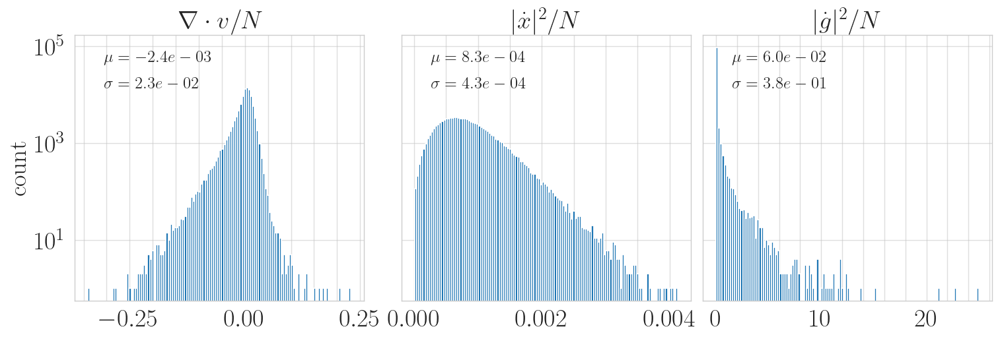

In [14]:
make_histograms(
    div_vs=np.sum(dist_div_vs, axis=1),
    xdots=np.sum(dist_xdots**2, axis=(1, 2)),
    gdots=np.sum(dist_gdots**2, axis=(1, 2)),
    cfg=cfg,
    bins=128,
    # save_str=''
    output_folder=figure_output,
    save_str='epr_hists'
)

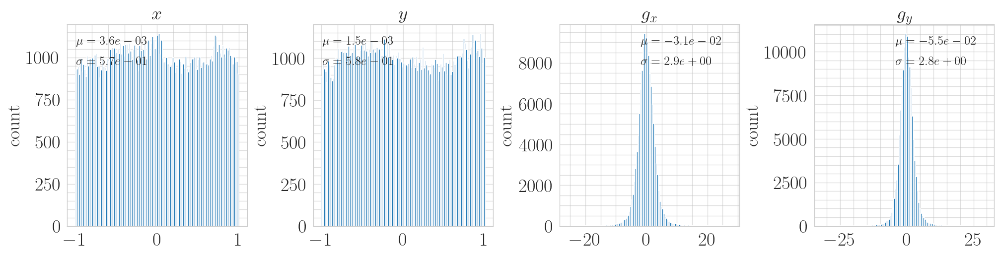

In [43]:
make_xg_histograms(
    xs=xs[::500],
    gs=gs[::500],
    cfg=cfg,
    bins=128,
    output_folder=figure_output,
    save_str=''
)

# Save and Load

## Save SDE Trajectory Data

In [13]:
traj_data = {
    'sde_movie_traj': sde_movie_traj,
    'div_vs': div_vs,
    'xdots': xdots,
    'gdots': gdots,
}

pickle.dump(traj_data, open(f'{data_output}/sde_traj_data.npy', 'wb'))

## Load SDE Trajectory Data

In [9]:
traj_data = pickle.load(open(f'{data_output}/sde_traj_data.npy', 'rb'))

In [10]:
sde_movie_traj = traj_data['sde_movie_traj']
div_vs = traj_data['div_vs']
xdots = traj_data['xdots']
gdots = traj_data['gdots']
sde_skip = traj_data['sde_skip']

## Save PSD Data

In [ ]:
psd_data = {
    'div_vs': psd_div_vs,
    'xdots': psd_xdots,
    'gdots': psd_gdots
}

pickle.dump(psd_data, open(f'{data_output}/psd_data.npy', 'wb'))

## Load PSD Data

In [5]:
psd_data = pickle.load(open(f'{data_output}/psd_data.npy', 'rb'))

In [6]:
psd_div_vs, psd_gdots = psd_data['div_vs'], psd_data['gdots']
psd_skip = psd_data['psd_skip']

## Save histogram data

In [ ]:
hist_data = {
    'dist_div_vs': dist_div_vs, 
    'dist_xdots': dist_xdots, 
    'dist_gdots': dist_gdots
}

pickle.dump(hist_data, open(f'{data_output}/hist_data.npy', 'wb'))

## Load histogram data

# Extension to more particles

In [43]:
## generate trajectory with more particles
large_N = 512
large_N_phi = cfg.phi

large_N_traj = generate_trajectory(
    nbatches=100,
    thermalize_fac=10.0,
    N=large_N,
    phi=large_N_phi,
    cfg=cfg
)

large_N_xs, large_N_gs = np.split(large_N_traj, 2, axis=1)

  0%|          | 0/100 [00:00<?, ?it/s]

Filling in the boundary case: (20001, 20002)
Finished generating trajectory.


In [44]:
## test application of the network
large_N_cfg = ml_collections.ConfigDict(cfg)
large_N_cfg.N = large_N
large_N_net, large_N_map_net = learn.construct_network(large_N_cfg)
# large_N_net.apply(ema_params[0.9999]['g'], large_N_xs[0], large_N_gs[0])

In [45]:
## compute quantities for movie
large_N_skip = 25
large_N_movie_traj = large_N_traj[::large_N_skip]

large_N_div_vs, large_N_xdots, large_N_gdots = calc_movie_quantities(
    params=ema_params[0.9999],
    movie_traj=large_N_movie_traj,
    nbatches_compute=100,
    net=large_N_net
)

  0%|          | 0/100 [00:00<?, ?it/s]

Capping off the uneven batch at the end. (800, 801)


Finished animation on frame 0/250. Time: 0.3799912929534912s.
Finished animation on frame 25/250. Time: 15.096426725387573s.
Finished animation on frame 50/250. Time: 30.324277877807617s.
Finished animation on frame 75/250. Time: 46.34436082839966s.
Finished animation on frame 100/250. Time: 62.38385844230652s.
Finished animation on frame 125/250. Time: 78.430020570755s.
Finished animation on frame 150/250. Time: 94.46844267845154s.
Finished animation on frame 175/250. Time: 110.4632658958435s.
Finished animation on frame 200/250. Time: 126.46835017204285s.
Finished animation on frame 225/250. Time: 142.43965339660645s.
Saved to /scratch/nb3397/results/strato/vicsek/7_15_24/figures/sde_entropy_movie_N=512.mp4


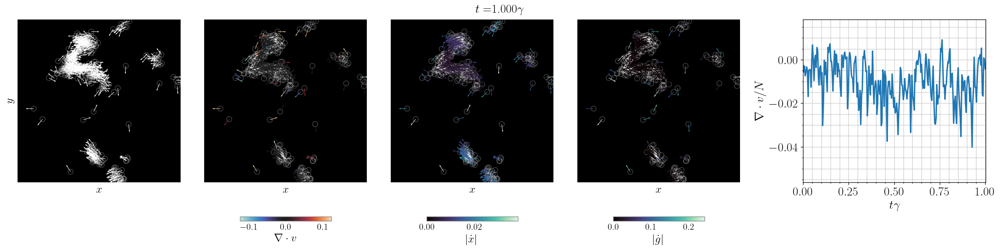

In [46]:
## make movie
make_entropy_movie(
    params=ema_params[0.9999],
    traj=large_N_movie_traj,
    div_vs=large_N_div_vs,
    xdots=large_N_xdots,
    gdots=large_N_gdots,
    nframes=250,
    clip_quantile=0.025,
    skip=large_N_skip,
    output_folder=figure_output,
    output_name=f'sde_entropy_movie_N={large_N}',
    cfg=cfg
)